<div style="background-color:#ffb770   ;padding:5px;border-radius:10px;border:10px solid #a3a3a3;color:#000000  ;text-align:center; font-weight: 1000; font-family: Babas; font-size: 3.0em;">
<p style="text-align:center;" > Automatic categorisation of stack overflow questions  |Modelling</p>
    
<p style="text-align:center;" ><img src="https://www.silicon.fr/wp-content/uploads/2019/08/stack_overflow.jpg"   width="400" height="250"/></p>
</div>

<a id="IR"></a>


 <h1 style="background-color:#ffb770 ;padding:20px;border-radius:10px;border:10px solid #a3a3a3;font-weight: 1000;color:#000000;text-align:center; font-size: 2.0em" >Import libraries and data</h1>


<a id="imp"></a>
## <span style="color:#763d05;  font-weight: 1000;font-size: 1.0em"> Import libraries </span>

In [1]:
#builtin
import os, sys, time, random

#data
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import re 

from bs4 import BeautifulSoup
import unicodedata
import contractions
import nltk

import string
from nltk.stem import WordNetLemmatizer 

from nltk.corpus import words, stopwords
from wordcloud import WordCloud

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

import plotly.express as px
import plotly.graph_objects as go

from tqdm.notebook import tqdm
tqdm.pandas()

# Target encodery
from sklearn.preprocessing import MultiLabelBinarizer
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")

In [2]:
# download

"""
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('words')
nltk.download('punkt')
"""

"\nnltk.download('omw-1.4')\nnltk.download('wordnet')\nnltk.download('stopwords')\nnltk.download('words')\nnltk.download('punkt')\n"

In [3]:
sns.set()

In [4]:
stopwords = nltk.corpus.stopwords.words('english')

In [5]:
DEBUG =False

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Data loading and reading </span>

In [6]:
#df = pd.read_csv("./data/clean_data/data_cleaned.csv")
df = pd.read_pickle("./data/clean_data/data_cleaned.pkl")

if DEBUG == True:
    df = df.head(1000)

In [7]:
X_train = pd.read_pickle('./data/clean_data/X_train.pkl')
X_test = pd.read_pickle('./data/clean_data/X_test.pkl')
Y_train = pd.read_pickle('./data/clean_data/Y_train.pkl')
Y_test = pd.read_pickle('./data/clean_data/Y_test.pkl')

In [8]:
df.describe()

,Title,Body,title,text,titleandbody,top_tag,selected_tag
count,48299,48299,48299,48299,48299,48299,48299
unique,48298,48299,48298,48299,48299,15175,14303
top,A potentially dangerous Request.Form value was...,The EJB 3.0 specification does not allow a bus...,potentially dangerous request.form value detec...,ejb 3.0 specification allow business method st...,multithreading stateless session bean ejb 3.0 ...,[android],{android}
freq,2,1,2,1,1,1004,1004


In [9]:
df.head()

,Title,Body,title,text,titleandbody,top_tag,selected_tag
0,Multithreading in a stateless session bean?,The EJB 3.0 specification does not allow a bus...,multithreading stateless session bean,ejb 3.0 specification allow business method st...,multithreading stateless session bean ejb 3.0 ...,"[java, multithreading, jakarta-ee]","{multithreading, java, jakarta-ee}"
1,base64 JSON encoded strings in nodejs,How do I create a base64 JSON encoded strings ...,base64 json encoded string nodejs,create base64 json encoded string nodejs tried...,base64 json encoded string nodejs create base6...,"[javascript, json, node.js]","{json, node.js, javascript}"
2,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12...",I get the following link error when I am compi...,link error `` find -ltinfo '' ubuntu 12.04 32-...,get following link error compiling small funct...,link error `` find -ltinfo '' ubuntu 12.04 32-...,"[c++, ubuntu]","{c++, ubuntu}"
3,How to sort array of strings which contains bo...,"String str[]={""-123"",""89"",""-10"",""456""}; str i...",sort array string contains negative positive n...,string str `` -123 '' '' 89 '' '' -10 '' '' 45...,sort array string contains negative positive n...,"[c++, arrays, string, algorithm, sorting]","{arrays, c++, sorting, algorithm, string}"
4,Multithreading program stuck in optimized mode...,I wrote a simple multithreading programs as fo...,multithreading program stuck optimized mode ru...,wrote simple multithreading program follows st...,multithreading program stuck optimized mode ru...,"[c++, multithreading]","{multithreading, c++}"


In [10]:
X_train.describe()

,Title,Body,title,text,titleandbody
count,32360,32360,32360,32360,32360
unique,32359,32360,32359,32360,32360
top,A potentially dangerous Request.Form value was...,I have been struggling the selectionStart and ...,potentially dangerous request.form value detec...,struggling selectionstart selectionend attribu...,selectionstart selectionend contenteditable el...
freq,2,1,2,1,1


In [11]:
Y_train.describe()

count         32360
unique        11359
top       [android]
freq            673
Name: top_tag, dtype: object

In [12]:
X_test.describe()

,Title,Body,title,text,titleandbody
count,15939,15939,15939,15939,15939
unique,15939,15939,15939,15939,15939
top,Animated rgl graphs with knitr,I want to include animated rgl graphs in my .R...,animated rgl graph knitr,want include animated rgl graph .rnw document ...,animated rgl graph knitr want include animated...
freq,1,1,1,1,1


In [13]:
Y_test.describe()

count         15939
unique         6694
top       [android]
freq            331
Name: top_tag, dtype: object

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Data transformation </span>

We split our dataset into train and test sets.

In [14]:
no_features=4000
tfidf_vectorizert = TfidfVectorizer(max_df=0.95, 
                                   min_df=2, 
                                   max_features=no_features, 
                                   stop_words='english')
X_train_tfidft = tfidf_vectorizert.fit_transform(X_train.title)
X_test_tfidft = tfidf_vectorizert.transform(X_test.title)
text_features = tfidf_vectorizert.get_feature_names_out()

In [15]:
tfidf_vectorizerb = TfidfVectorizer(max_df=0.95, 
                                   min_df=2, 
                                   max_features=no_features, 
                                   stop_words='english')
X_train_tfidfb = tfidf_vectorizerb.fit_transform(X_train.text)
X_test_tfidfb = tfidf_vectorizerb.transform(X_test.text)
text_features = tfidf_vectorizerb.get_feature_names_out()

In [16]:
vectorizerb = CountVectorizer(max_df=0.95, 
                             min_df=2,  
                             stop_words='english')
X_train_cvb = vectorizerb.fit_transform(X_train.text)
X_test_cvb = vectorizerb.transform(X_test.text)

In [17]:
vectorizert = CountVectorizer(max_df=0.95, 
                             min_df=2,  
                             stop_words='english')
X_train_cvt = vectorizert.fit_transform(X_train.title)
X_test_cvt = vectorizert.transform(X_test.title)

In [18]:
tfidf_vectorizertb = TfidfVectorizer(max_df=0.95, 
                                   min_df=2, 
                                   max_features=no_features, 
                                   stop_words='english')
X_train_tfidftb = tfidf_vectorizertb.fit_transform(X_train.titleandbody)
X_test_tfidftb = tfidf_vectorizertb.transform(X_test.titleandbody)

In [19]:
vectorizertb = CountVectorizer(max_df=0.95, 
                             min_df=2,
                             max_features=no_features,
                             stop_words='english')
X_train_cvtb = vectorizertb.fit_transform(X_train.titleandbody)
title_text_feature = vectorizertb.get_feature_names_out()
X_test_cvtb = vectorizertb.transform(X_test.titleandbody)

In [20]:
from scipy.sparse import hstack
X_train_tfidf = hstack([X_train_tfidft, X_train_tfidfb])
X_test_tfidf = hstack([X_test_tfidft, X_test_tfidfb])

X_train_cv = hstack([X_train_cvt, X_train_cvb])
X_test_cv = hstack([X_test_cvt, X_test_cvb])

In [21]:
mlb = MultiLabelBinarizer()
#mlb.fit(Y_train)
y_train_mlb = mlb.fit_transform(Y_train)
y_test_mlb = mlb.transform(Y_test)
tags = mlb.classes_

<a id="IR"></a>
<h1 style="background-color:#ffb770 ;padding:20px;border-radius:10px;border:10px solid #a3a3a3;font-weight: 1000;color:#000000;text-align:center; font-size: 2.0em" >Topic Modelling: Unsupervised approach</h1>

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> LatentDirichletAllocation </span>

<a id="imp"></a>
### <span style="font-weight: 1000;font-size: 1.0em"> LatentDirichletAllocation  with countervectorizer</span>

In [22]:
#Gensim
from imp import reload
import gensim
import gensim.corpora as corpora
from gensim.corpora import Dictionary
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.models import LdaModel
from gensim.models import TfidfModel

from gensim.models.nmf import Nmf

from sklearn.decomposition import LatentDirichletAllocation
#vis
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
#import pyLDAvis.gensim

In [23]:
lda_model = LatentDirichletAllocation(n_components = 13, random_state=42)
lda_model.fit(X_train_cvtb)
W_lda_matrix = lda_model.fit_transform(X_train_cvtb)
H_lda_matrix = lda_model.components_

In [24]:
def display_topics(model, features, no_top_words=5):
    for topic, words in enumerate(model.components_):
        total = words.sum()
        largest = words.argsort()[::-1] # invert sort order
        print("\nTopic %02d" % topic)
        for i in range(0, no_top_words):
            print("  %s (%2.2f)" % (features[largest[i]], abs(words[largest[i]]*100.0/total)))

In [25]:
display_topics(lda_model, vectorizertb.get_feature_names_out())


Topic 00
  server (4.13)
  connection (1.99)
  database (1.25)
  run (1.24)
  php (1.17)

Topic 01
  function (2.86)
  js (2.68)
  page (1.92)
  html (1.72)
  event (1.26)

Topic 02
  file (6.12)
  using (1.35)
  error (1.12)
  project (1.09)
  window (0.98)

Topic 03
  image (2.90)
  view (1.85)
  text (1.58)
  color (1.08)
  width (1.04)

Topic 04
  lib (4.39)
  python (2.78)
  py (2.53)
  usr (2.48)
  file (2.29)

Topic 05
  self (2.69)
  int (2.42)
  thread (1.79)
  std (1.76)
  code (1.43)

Topic 06
  public (7.79)
  new (5.51)
  string (4.99)
  class (3.76)
  private (2.98)

Topic 07
  java (8.98)
  org (5.41)
  00 (1.85)
  springframework (1.61)
  apache (1.46)

Topic 08
  type (2.62)
  value (2.43)
  id (2.12)
  class (1.90)
  return (1.57)

Topic 09
  use (1.74)
  like (1.58)
  using (1.44)
  way (1.38)
  code (1.09)

Topic 10
  data (2.40)
  time (1.35)
  array (1.21)
  table (1.17)
  value (1.08)

Topic 11
  android (5.30)
  app (4.42)
  com (2.93)
  build (1.79)
  google (

In [26]:
H_lda_matrix.sum(axis=0)/W_lda_matrix.sum()*100.0

array([13.13658838,  1.82941904,  0.95797281, ...,  1.03831891,
        0.85599506,  0.93016069])

In [27]:
# Obtain the topic-word matrix
topic_word = lda_model.components_

# Obtain the document-topic matrix
doc_topic = lda_model.transform(X_train_cvtb)

# Obtain the question-words matrix
quest_words = np.dot(doc_topic, topic_word)
quest_words.shape

(32360, 4000)

In [28]:
predict = lda_model.transform(X_test_cvtb)

In [29]:
quest_words_test = np.dot(predict, topic_word)
quest_words_test.shape

(15939, 4000)

In [30]:
from sklearn.metrics.pairwise import cosine_similarity
similarity=cosine_similarity(quest_words, quest_words_test)

In [31]:
pd.DataFrame(similarity)

,0,1,2,3,4,5,6,7,8,9,...,15929,15930,15931,15932,15933,15934,15935,15936,15937,15938
0,0.436998,0.399032,0.462319,0.348574,0.479101,0.370163,0.930412,0.697021,0.376034,0.350973,...,0.963076,0.067850,0.673611,0.693704,0.360584,0.086353,0.262709,0.087221,0.282530,0.425914
1,0.842201,0.435174,0.953966,0.311434,0.588668,0.406732,0.355042,0.387126,0.414404,0.312924,...,0.361629,0.067873,0.346790,0.486986,0.440961,0.086069,0.256581,0.097715,0.262091,0.423260
2,0.470808,0.452636,0.424265,0.370959,0.656051,0.392229,0.329448,0.343869,0.399438,0.371469,...,0.354094,0.080028,0.327240,0.443802,0.424844,0.094277,0.290623,0.089793,0.293911,0.540209
3,0.878895,0.415984,0.946657,0.304332,0.605130,0.503292,0.343009,0.387272,0.507590,0.311203,...,0.346801,0.067610,0.342145,0.487539,0.438158,0.085945,0.237432,0.099656,0.424640,0.460358
4,0.599308,0.739556,0.483778,0.628904,0.696233,0.657000,0.535677,0.532405,0.667365,0.631369,...,0.546026,0.108559,0.517037,0.752230,0.744456,0.135853,0.424194,0.118603,0.403545,0.823098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32355,0.352011,0.691046,0.254193,0.379186,0.479220,0.387843,0.395409,0.386385,0.396421,0.373713,...,0.537894,0.151054,0.390257,0.453804,0.430913,0.151559,0.386376,0.136317,0.249822,0.473184
32356,0.559253,0.395960,0.304626,0.315766,0.370597,0.843950,0.311262,0.323723,0.833262,0.345659,...,0.308275,0.044392,0.313666,0.420466,0.396616,0.060254,0.205845,0.056615,0.997412,0.561336
32357,0.357211,0.661494,0.237943,0.293747,0.427610,0.463667,0.339308,0.352162,0.467136,0.297898,...,0.506787,0.118567,0.355081,0.399816,0.369689,0.113236,0.291433,0.103654,0.426109,0.426102
32358,0.361835,0.643610,0.259579,0.420446,0.496876,0.392536,0.423929,0.383499,0.400796,0.420481,...,0.531866,0.094717,0.398620,0.458337,0.433126,0.100375,0.364729,0.084564,0.255789,0.501206


In [32]:
def wordcloud_topics(model, features, no_top_words=40):
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", max_words=100,
                       width=960, height=540)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'topic{topic}.png')

wordcloud_topics(lda_para_model, vectorizer.get_feature_names())

<a id="imp"></a>
### <span style="font-weight: 1000;font-size: 1.0em"> LatentDirichletAllocation  with Gensim</span>

<a id="imp"></a>
### <span style="font-weight: 1000;font-size: 1.0em"> Optimize number of LDA topics</span>

In [33]:
# create retokenized documents
gensim_text = [[w for w in re.findall(r'\b\w\w+\b', paragraph.lower()) if w not in stopwords] for paragraph in X_train["titleandbody"]]

#dictionary definition
dict_gensim = Dictionary(gensim_text)
#filtering value
dict_gensim.filter_extremes( no_above=0.85,keep_n=5000)
#Bag of word 
bow_gensim = [dict_gensim.doc2bow(paragraph) for paragraph in gensim_text]

In [34]:
tfidf_gensim = TfidfModel(bow_gensim)
vectors_gensim = tfidf_gensim[bow_gensim]
tfidf_corpus = [tfidf_gensim[text] for text in bow_gensim]

In [35]:
from gensim.models.ldamulticore import LdaMulticore
lda_para_model_n = []
for n in tqdm(range(10, 30)):
    lda_model = LdaMulticore(corpus=bow_gensim, id2word=dict_gensim, chunksize=100,
                             eta='auto', iterations=10, num_topics=n, passes=20, 
                             eval_every=None, random_state=42)
    lda_coherence = CoherenceModel(model=lda_model, texts=gensim_text, 
                                   dictionary=dict_gensim, coherence='c_v')
    lda_para_model_n.append((n, lda_model, lda_coherence.get_coherence()))

  0%|          | 0/20 [00:00<?, ?it/s]

<Axes: xlabel='n'>

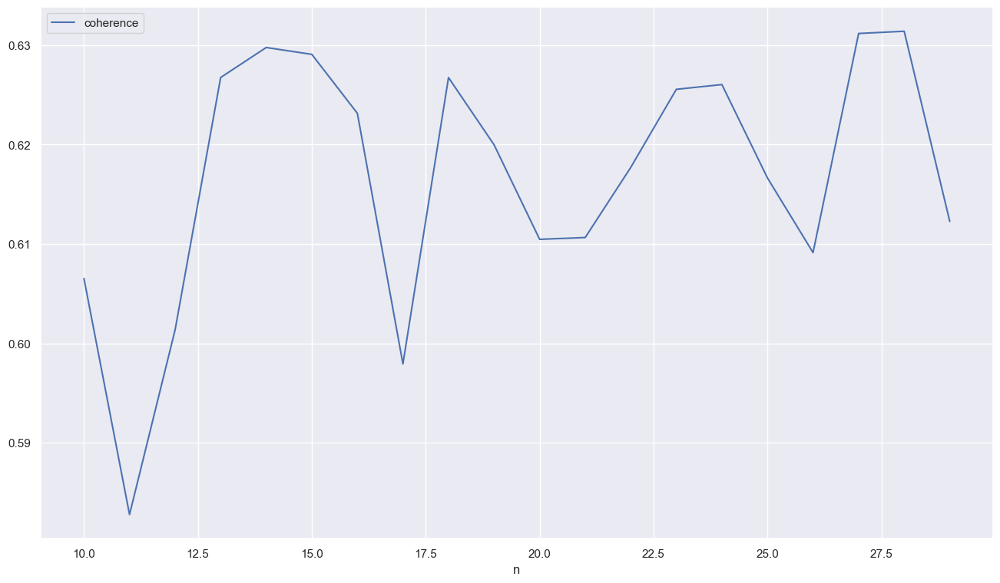

In [36]:
coherence_df = pd.DataFrame(lda_para_model_n, columns=["n", "model", "coherence"]).set_index("n")
coherence_df[["coherence"]].plot(figsize=(16,9))

In [37]:
n = coherence_df.coherence.idxmax()
print("The optimal number of topic is ", n)

The optimal number of topic is  28


The optimal number of topic is 20

In [38]:
lda_opt_model = lda_para_model_n[n-10][1]

In [39]:
def display_topics_gensim(model):
    for topic in range(0, model.num_topics):
        print("\nTopic %02d" % topic)
        for (word, prob) in model.show_topic(topic, topn=5):
            print("  %s (%2.2f)" % (word, prob))

In [40]:
display_topics_gensim(lda_opt_model)


Topic 00
  file (0.19)
  path (0.03)
  using (0.02)
  read (0.02)
  xml (0.02)

Topic 01
  view (0.05)
  app (0.04)
  io (0.03)
  device (0.02)
  video (0.02)

Topic 02
  library (0.03)
  command (0.03)
  linux (0.02)
  bin (0.02)
  error (0.01)

Topic 03
  would (0.03)
  like (0.02)
  use (0.02)
  way (0.02)
  one (0.01)

Topic 04
  data (0.02)
  model (0.02)
  np (0.02)
  point (0.02)
  float (0.01)

Topic 05
  page (0.03)
  html (0.02)
  event (0.02)
  button (0.02)
  function (0.02)

Topic 06
  image (0.06)
  color (0.02)
  width (0.02)
  height (0.02)
  size (0.02)

Topic 07
  thread (0.05)
  task (0.03)
  process (0.03)
  run (0.02)
  call (0.02)

Topic 08
  web (0.08)
  net (0.07)
  system (0.07)
  service (0.06)
  asp (0.03)

Topic 09
  time (0.03)
  memory (0.03)
  byte (0.02)
  number (0.01)
  size (0.01)

Topic 10
  android (0.13)
  java (0.06)
  com (0.05)
  google (0.04)
  app (0.03)

Topic 11
  java (0.16)
  org (0.10)
  springframework (0.03)
  apache (0.03)
  spring (0

In [41]:
topic_word_matrix = lda_opt_model.get_topics()

In [42]:
num_topics, num_words = topic_word_matrix.shape
# Print the shape of the topic word matrix
print("Number of topics:", num_topics)
print("Number of words in the dictionary:", num_words)

Number of topics: 28
Number of words in the dictionary: 5000


In [43]:
# Get the topics generated by the LDA model
topics = lda_opt_model.print_topics()

# Print the topics
for topic_idx, topic in topics:
    print("Topic", topic_idx, ":", topic)

Topic 22 : 0.106*"line" + 0.098*"python" + 0.061*"import" + 0.054*"print" + 0.020*"code" + 0.018*"py" + 0.014*"mov" + 0.013*"module" + 0.013*"sub" + 0.012*"call"
Topic 19 : 0.051*"10" + 0.042*"00" + 0.030*"12" + 0.027*"11" + 0.026*"date" + 0.021*"15" + 0.019*"13" + 0.018*"01" + 0.017*"17" + 0.016*"07"
Topic 14 : 0.056*"int" + 0.040*"std" + 0.029*"function" + 0.025*"type" + 0.025*"include" + 0.021*"return" + 0.021*"const" + 0.020*"template" + 0.016*"void" + 0.016*"main"
Topic 18 : 0.076*"function" + 0.072*"var" + 0.056*"js" + 0.047*"node" + 0.041*"console" + 0.038*"log" + 0.029*"angular" + 0.024*"error" + 0.023*"npm" + 0.020*"err"
Topic 4 : 0.021*"data" + 0.019*"model" + 0.017*"np" + 0.016*"point" + 0.013*"float" + 0.012*"df" + 0.011*"import" + 0.011*"numpy" + 0.010*"shape" + 0.009*"matrix"
Topic 9 : 0.032*"time" + 0.027*"memory" + 0.015*"byte" + 0.015*"number" + 0.014*"size" + 0.014*"data" + 0.013*"performance" + 0.011*"bit" + 0.011*"second" + 0.008*"long"
Topic 20 : 0.097*"window" + 0

In [44]:
#Find the most relevant words for each topic
n = 5
for topic_idx, topic in enumerate(topic_word_matrix):
    most_relevant_words = [dict_gensim[word_idx] for word_idx in topic.argsort()[:-n-1:-1]]
    print("Topic", topic_idx, ":", most_relevant_words)

Topic 0 : ['file', 'path', 'using', 'read', 'xml']
Topic 1 : ['view', 'app', 'io', 'device', 'video']
Topic 2 : ['library', 'command', 'linux', 'bin', 'error']
Topic 3 : ['would', 'like', 'use', 'way', 'one']
Topic 4 : ['data', 'model', 'np', 'point', 'float']
Topic 5 : ['page', 'html', 'event', 'button', 'function']
Topic 6 : ['image', 'color', 'width', 'height', 'size']
Topic 7 : ['thread', 'task', 'process', 'run', 'call']
Topic 8 : ['web', 'net', 'system', 'service', 'asp']
Topic 9 : ['time', 'memory', 'byte', 'number', 'size']
Topic 10 : ['android', 'java', 'com', 'google', 'app']
Topic 11 : ['java', 'org', 'springframework', 'apache', 'spring']
Topic 12 : ['user', 'password', 'session', 'token', 'email']
Topic 13 : ['import', 'component', 'app', 'module', 'react']
Topic 14 : ['int', 'std', 'function', 'type', 'include']
Topic 15 : ['id', 'table', 'database', 'query', 'data']
Topic 16 : ['http', 'request', 'com', 'url', 'response']
Topic 17 : ['lib', 'py', 'ruby', 'django', 'users

In [45]:
n = 10
for topic_idx, topic in enumerate(topic_word_matrix):
    most_relevant_words = []
    for word_idx in topic.argsort()[:-n-1:-1]:
        if word_idx < len(dict_gensim):
            most_relevant_words.append(dict_gensim[word_idx])
    print("Topic", topic_idx, ":", most_relevant_words)

Topic 0 : ['file', 'path', 'using', 'read', 'xml', 'stream', 'data', 'folder', 'directory', 'open']
Topic 1 : ['view', 'app', 'io', 'device', 'video', 'nil', 'self', 'iphone', 'notification', 'code']
Topic 2 : ['library', 'command', 'linux', 'bin', 'error', 'usr', 'install', 'script', 'run', 'symbol']
Topic 3 : ['would', 'like', 'use', 'way', 'one', 'using', 'need', 'question', 'know', 'want']
Topic 4 : ['data', 'model', 'np', 'point', 'float', 'df', 'import', 'numpy', 'shape', 'matrix']
Topic 5 : ['page', 'html', 'event', 'button', 'function', 'jquery', 'click', 'form', 'javascript', 'browser']
Topic 6 : ['image', 'color', 'width', 'height', 'size', 'text', 'background', 'cell', 'position', 'font']
Topic 7 : ['thread', 'task', 'process', 'run', 'call', 'start', 'block', 'async', 'code', 'method']
Topic 8 : ['web', 'net', 'system', 'service', 'asp', 'application', 'using', 'mvc', 'framework', 'microsoft']
Topic 9 : ['time', 'memory', 'byte', 'number', 'size', 'data', 'performance', 'bi

In [46]:
document_topic_matrix = lda_opt_model[bow_gensim]
# Convert the document-topic matrix to a numpy array
document_topic_matrix = gensim.matutils.corpus2dense(document_topic_matrix, num_terms=len(dict_gensim)).T

In [47]:
len(document_topic_matrix)

32360

In [48]:
# Find the most relevant topic for each document
most_relevant_topics = [topic_idx for topic_idx in document_topic_matrix.argmax(axis=1)]

for document_idx, topic_idx in enumerate(most_relevant_topics):
    print("Document", document_idx, ": topic", topic_idx)

Document 0 : topic 5
Document 1 : topic 23
Document 2 : topic 14
Document 3 : topic 2
Document 4 : topic 9
Document 5 : topic 17
Document 6 : topic 18
Document 7 : topic 5
Document 8 : topic 25
Document 9 : topic 15
Document 10 : topic 3
Document 11 : topic 23
Document 12 : topic 3
Document 13 : topic 15
Document 14 : topic 23
Document 15 : topic 3
Document 16 : topic 3
Document 17 : topic 19
Document 18 : topic 5
Document 19 : topic 21
Document 20 : topic 18
Document 21 : topic 23
Document 22 : topic 12
Document 23 : topic 24
Document 24 : topic 16
Document 25 : topic 26
Document 26 : topic 3
Document 27 : topic 3
Document 28 : topic 0
Document 29 : topic 26
Document 30 : topic 3
Document 31 : topic 12
Document 32 : topic 3
Document 33 : topic 8
Document 34 : topic 13
Document 35 : topic 3
Document 36 : topic 15
Document 37 : topic 3
Document 38 : topic 3
Document 39 : topic 25
Document 40 : topic 5
Document 41 : topic 16
Document 42 : topic 25
Document 43 : topic 17
Document 44 : top

In [49]:
lda_gensim_coherence = CoherenceModel(model=lda_opt_model, texts=gensim_text, dictionary=dict_gensim, coherence='c_v')
lda_gensim_coherence_score = lda_gensim_coherence.get_coherence()
print(lda_gensim_coherence_score)

0.6314036686671611


In [50]:
display_topics_gensim(lda_opt_model)


Topic 00
  file (0.19)
  path (0.03)
  using (0.02)
  read (0.02)
  xml (0.02)

Topic 01
  view (0.05)
  app (0.04)
  io (0.03)
  device (0.02)
  video (0.02)

Topic 02
  library (0.03)
  command (0.03)
  linux (0.02)
  bin (0.02)
  error (0.01)

Topic 03
  would (0.03)
  like (0.02)
  use (0.02)
  way (0.02)
  one (0.01)

Topic 04
  data (0.02)
  model (0.02)
  np (0.02)
  point (0.02)
  float (0.01)

Topic 05
  page (0.03)
  html (0.02)
  event (0.02)
  button (0.02)
  function (0.02)

Topic 06
  image (0.06)
  color (0.02)
  width (0.02)
  height (0.02)
  size (0.02)

Topic 07
  thread (0.05)
  task (0.03)
  process (0.03)
  run (0.02)
  call (0.02)

Topic 08
  web (0.08)
  net (0.07)
  system (0.07)
  service (0.06)
  asp (0.03)

Topic 09
  time (0.03)
  memory (0.03)
  byte (0.02)
  number (0.01)
  size (0.01)

Topic 10
  android (0.13)
  java (0.06)
  com (0.05)
  google (0.04)
  app (0.03)

Topic 11
  java (0.16)
  org (0.10)
  springframework (0.03)
  apache (0.03)
  spring (0

In [51]:
# Compute Perplexity
print('\nPerplexity: ', lda_opt_model.log_perplexity(bow_gensim))  # a measure of how good the model is. lower the better.


Perplexity:  -7.007114923227933


In [52]:
print(lda_opt_model.print_topics())
doc_lda = lda_opt_model[bow_gensim]

[(4, '0.021*"data" + 0.019*"model" + 0.017*"np" + 0.016*"point" + 0.013*"float" + 0.012*"df" + 0.011*"import" + 0.011*"numpy" + 0.010*"shape" + 0.009*"matrix"'), (27, '0.119*"test" + 0.096*"self" + 0.033*"return" + 0.028*"foo" + 0.023*"method" + 0.023*"def" + 0.021*"bar" + 0.020*"unit" + 0.018*"true" + 0.018*"class"'), (25, '0.040*"project" + 0.028*"version" + 0.027*"error" + 0.024*"build" + 0.014*"package" + 0.013*"git" + 0.013*"run" + 0.011*"debug" + 0.010*"dependency" + 0.010*"file"'), (26, '0.080*"server" + 0.037*"message" + 0.036*"client" + 0.033*"connection" + 0.023*"php" + 0.018*"connect" + 0.017*"socket" + 0.016*"port" + 0.013*"error" + 0.013*"send"'), (21, '0.088*"new" + 0.080*"public" + 0.043*"void" + 0.038*"string" + 0.036*"null" + 0.036*"return" + 0.035*"private" + 0.032*"int" + 0.030*"static" + 0.019*"override"'), (0, '0.193*"file" + 0.027*"path" + 0.020*"using" + 0.019*"read" + 0.017*"xml" + 0.017*"stream" + 0.016*"data" + 0.015*"folder" + 0.015*"directory" + 0.012*"open"

In [53]:
THRESHOLD = 0.001
# Obtain the topic-word matrix
topic_word = lda_opt_model.state.get_lambda()

# Obtain the document-topic matrix
doc_topic = lda_opt_model[bow_gensim]

# Convert the document-topic matrix to a numpy array
doc_topic_matrix = np.zeros((len(X_train), lda_opt_model.num_topics))
for i, document_topics in enumerate(doc_topic):
    for topic_id, topic_prob  in document_topics:
        if topic_prob >= THRESHOLD:
            doc_topic_matrix[i, topic_id] = topic_prob
        else:
            doc_topic_matrix[i, topic_id] = 0


# Obtain the question-words matrix
quest_words = np.dot(doc_topic_matrix, topic_word)

In [54]:
lda_opt_model.log_perplexity(bow_gensim)

-7.00709738714341

In [55]:
lda_opt_model.alpha

array([0.03571429, 0.03571429, 0.03571429, 0.03571429, 0.03571429,
       0.03571429, 0.03571429, 0.03571429, 0.03571429, 0.03571429,
       0.03571429, 0.03571429, 0.03571429, 0.03571429, 0.03571429,
       0.03571429, 0.03571429, 0.03571429, 0.03571429, 0.03571429,
       0.03571429, 0.03571429, 0.03571429, 0.03571429, 0.03571429,
       0.03571429, 0.03571429, 0.03571429], dtype=float32)

In [56]:
top_topics = lda_opt_model.top_topics(vectors_gensim, topn=5)
avg_topic_coherence = sum([t[1] for t in top_topics]) / len(top_topics)
print('Average topic coherence: %.4f.' % avg_topic_coherence)

Average topic coherence: -1.8227.


In [57]:
[(t[1], " ".join([w[1] for w in t[0]])) for t in top_topics]

[(-1.0347958774836408, 'would like use way one'),
 (-1.0878391112093546, 'class public object name get'),
 (-1.1859333483514232, 'new public void string null'),
 (-1.318915306576658, 'id table database query data'),
 (-1.3378309421541053, 'line python import print code'),
 (-1.464666563096283, 'http request com url response'),
 (-1.4719688954292807, 'thread task process run call'),
 (-1.493428272057081, 'image color width height size'),
 (-1.5384138922867538, 'android java com google app'),
 (-1.5630888164715047, 'int std function type include'),
 (-1.6676241968307615, 'project version error build package'),
 (-1.71660771436146, 'java org springframework apache spring'),
 (-1.7552708518347067, 'library command linux bin error'),
 (-1.7901601890854262, '10 00 12 11 date'),
 (-1.8283567636978293, 'page html event button function'),
 (-1.8328461795084448, 'web net system service asp'),
 (-1.8898958730595994, 'function var js node console'),
 (-1.9978746402743934, 'window dll application s

In [58]:
# Make predictions on the test data
topics = [lda_opt_model[doc] for doc in bow_gensim]
# Evaluate the model
perplexity = lda_opt_model.log_perplexity(bow_gensim)
print("Perplexity:", perplexity)

Perplexity: -7.007133213519798


In [59]:
quest_words.shape

(32360, 5000)

In [60]:
# Obtain the topic-word matrix
topic_word = lda_opt_model.get_topics()
topic_word.shape

(28, 5000)

In [61]:
pd.set_option('max_colwidth', 1000)
topic = pd.DataFrame(lda_opt_model.print_topics(), columns=['Topics', 'Proba*Word'])
topic

,Topics,Proba*Word
0,15,"0.041*""id"" + 0.041*""table"" + 0.032*""database"" + 0.031*""query"" + 0.028*""data"" + 0.025*""column"" + 0.025*""sql"" + 0.021*""select"" + 0.019*""row"" + 0.017*""item"""
1,11,"0.155*""java"" + 0.098*""org"" + 0.028*""springframework"" + 0.027*""apache"" + 0.025*""spring"" + 0.018*""jar"" + 0.017*""sun"" + 0.016*""com"" + 0.014*""web"" + 0.012*""lang"""
2,16,"0.080*""http"" + 0.055*""request"" + 0.038*""com"" + 0.036*""url"" + 0.032*""response"" + 0.027*""json"" + 0.024*""post"" + 0.022*""get"" + 0.021*""api"" + 0.020*""data"""
3,19,"0.051*""10"" + 0.042*""00"" + 0.030*""12"" + 0.027*""11"" + 0.026*""date"" + 0.021*""15"" + 0.019*""13"" + 0.018*""01"" + 0.017*""17"" + 0.016*""07"""
4,27,"0.119*""test"" + 0.096*""self"" + 0.033*""return"" + 0.028*""foo"" + 0.023*""method"" + 0.023*""def"" + 0.021*""bar"" + 0.020*""unit"" + 0.018*""true"" + 0.018*""class"""
5,24,"0.092*""class"" + 0.048*""public"" + 0.041*""object"" + 0.034*""name"" + 0.025*""get"" + 0.022*""model"" + 0.022*""set"" + 0.022*""property"" + 0.020*""type"" + 0.019*""method"""
6,12,"0.108*""user"" + 0.027*""password"" + 0.026*""session"" + 0.024*""token"" + 0.023*""email"" + 0.022*""login"" + 0.018*""authentication"" + 0.017*""username"" + 0.014*""app"" + 0.012*""access"""
7,9,"0.032*""time"" + 0.027*""memory"" + 0.015*""byte"" + 0.015*""number"" + 0.014*""size"" + 0.014*""data"" + 0.013*""performance"" + 0.011*""bit"" + 0.011*""second"" + 0.008*""long"""
8,5,"0.034*""page"" + 0.024*""html"" + 0.024*""event"" + 0.018*""button"" + 0.016*""function"" + 0.016*""jquery"" + 0.016*""click"" + 0.015*""form"" + 0.015*""javascript"" + 0.014*""browser"""
9,6,"0.057*""image"" + 0.023*""color"" + 0.020*""width"" + 0.019*""height"" + 0.018*""size"" + 0.017*""text"" + 0.012*""background"" + 0.011*""cell"" + 0.011*""position"" + 0.011*""font"""


In [62]:
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_opt_model, bow_gensim, dict_gensim, mds="mmds", R=30)
pyLDAvis.save_html(vis, './img/lda.html')
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.013586 -0.227500       1        1  15.832997
25    -0.139510 -0.040954       2        1   4.757019
5     -0.127957 -0.229967       3        1   4.423581
9      0.111518 -0.311727       4        1   4.235391
24     0.306175 -0.077358       5        1   4.156665
15    -0.007385 -0.394797       6        1   4.127152
16    -0.262896 -0.042015       7        1   3.974084
21     0.450413 -0.050232       8        1   3.916325
11     0.184013  0.464121       9        1   3.907833
23     0.236691 -0.218412      10        1   3.715681
6      0.148089 -0.426981      11        1   3.663445
14     0.162647 -0.045669      12        1   3.325630
19    -0.244176  0.484258      13        1   3.168508
26     0.076206  0.115885      14        1   3.103076
1     -0.322564 -0.168436      15        1   3.103038
2     -0.396693 -0.009271      16        1   2.981389
7     -0.070093  0.082736      17        1   2.977277
0     -0.187401 -0.375637      18        1   2.926405
12    -0.303814 -0.280223      19        1   2.925804
4      0.315292 -0.289119      20        1   2.775422
27     0.061450  0.270152      21        1   2.235458
18     0.372070  0.249932      22        1   2.227881
8      0.387638  0.121995      23        1   2.154683
13    -0.305834  0.203406      24        1   2.106798
10    -0.452277  0.191927      25        1   2.030448
20     0.235791  0.248854      26        1   1.788393
17    -0.036631  0.470336      27        1   1.735472
22    -0.177175  0.284699      28        1   1.724146, topic_info=           Term          Freq         Total Category  logprob  loglift
1140       java  24575.000000  24575.000000  Default  30.0000  30.0000
129        file  23503.000000  23503.000000  Default  29.0000  29.0000
353      public  16967.000000  16967.000000  Default  28.0000  28.0000
352         org  12811.000000  12811.000000  Default  27.0000  27.0000
398       class  17578.000000  17578.000000  Default  26.0000  26.0000
...         ...           ...           ...      ...      ...      ...
122       error    484.628434  17950.291513  Topic28  -4.7694   0.4485
48          try    350.390856   5133.427207  Topic28  -5.0938   1.3760
6     following    360.791634   8390.441730  Topic28  -5.0645   0.9139
211         get    362.313046  20006.936156  Topic28  -5.0603   0.0491
86       return    292.735262  16867.244623  Topic28  -5.2736   0.0066

[1800 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
594      13  0.999826          00
3692     10  0.021902        0000
3692     13  0.974641        0000
4370     13  0.989699      000000
324      13  0.992951          01
...     ...       ...         ...
2289     20  0.154963         zip
2289     25  0.035886         zip
2289     27  0.039149         zip
2119     11  0.998173        zoom
2717     25  0.996265  zygoteinit

[5821 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 26, 6, 10, 25, 16, 17, 22, 12, 24, 7, 15, 20, 27, 2, 3, 8, 1, 13, 5, 28, 19, 9, 14, 11, 21, 18, 23])

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Semi Supervised Learning</span>

In [64]:
# Get document-topic matrix from the LDA model
doc_topic_matrix = lda_opt_model.get_document_topics(bow_gensim, minimum_probability=0)

# Extract the topic probabilities from the matrix
topic_probs = [[prob for _, prob in doc_topics] for doc_topics in doc_topic_matrix]
top_tag = Y_train.to_list()
# Get the top label indices for each document
top_label_indices = [[i for i in range(n) if topic_probs[j][i] in sorted(topic_probs[j], reverse=True)[:(len(top_tag[j])+1)]] for j in range(len(X_train)-1)]

# Convert label indices to label names
predicted_label = [[tags[i] for i in indices] for indices in top_label_indices]

# Print results
for i, label in enumerate(predicted_label):
    print(f"Document {i+1}: {label}")

# Assign predicted labels to the training data
lda_train = X_train.copy()
lda_train["predicted_label"] = predicted_label


Document 1: ['amazon-web-services']
Document 2: ['algorithm']
Document 3: ['ajax', 'algorithm', 'android-layout']
Document 4: ['.net-core', 'ajax', 'android']
Document 5: ['algorithm', 'amazon-s3', 'angular']
Document 6: ['algorithm']
Document 7: ['algorithm', 'amazon-web-services']
Document 8: ['ajax', 'algorithm', 'amazon-web-services', 'android-studio']
Document 9: ['android-studio']
Document 10: []
Document 11: ['.net', 'algorithm']
Document 12: ['amazon-s3']
Document 13: ['algorithm', 'amazon-s3']
Document 14: ['.net', '.net-core', 'ajax', 'algorithm', 'amazon-s3', 'amazon-web-services', 'android', 'android-layout', 'android-studio', 'angular']
Document 15: ['.net', 'angular']
Document 16: ['ajax', 'algorithm', 'android']
Document 17: ['algorithm', 'amazon-web-services', 'android']
Document 18: ['amazon-s3', 'angular']
Document 19: ['ajax', 'amazon-web-services', 'android-studio']
Document 20: ['.net']
Document 21: []
Document 22: ['.net-core', 'algorithm', 'android']
Document 23:

ValueError: Length of values (32359) does not match length of index (32360)

In [65]:
# Get document-topic matrix from the LDA model
doc_topic_matrix = lda_opt_model.get_document_topics(bow_gensim, minimum_probability=0)

# Extract the topic probabilities from the matrix
topic_probs = [[prob for _, prob in doc_topics] for doc_topics in doc_topic_matrix]

# Get the top label indices for each document
top_label_indices = [sorted(range(len(doc_topics)), key=lambda i: doc_topics[i], reverse=True)[:4] for doc_topics in topic_probs]

# Convert label indices to label names
predicted_label = [[tags[i] for i in indices] for indices in top_label_indices]

# Print results
for i, label in enumerate(predicted_label):
    print(f"Document {i+1}: {label}")

# Assign predicted labels to the training data
lda_train = X_train.copy()
lda_train["predicted_label"] = predicted_label


Document 1: ['amazon-web-services', 'asynchronous', 'asp.net-mvc-3', 'authentication']
Document 2: ['asynchronous', 'authentication', 'algorithm', 'asp.net-web-api']
Document 3: ['arrays', 'android-layout', 'algorithm', 'ajax']
Document 4: ['ajax', 'asp.net-web-api', 'android', 'arrays']
Document 5: ['angular', 'algorithm', 'amazon-s3', 'arrays']
Document 6: ['asp.net-mvc', 'async-await', 'algorithm', 'azure']
Document 7: ['asp.net-mvc-3', 'amazon-web-services', 'algorithm', 'asp.net-mvc']
Document 8: ['amazon-web-services', 'ajax', 'algorithm', 'asp.net-mvc-3']
Document 9: ['authentication', 'asp.net-web-api', 'android-studio', 'asp.net-core']
Document 10: ['asp.net', 'authentication', 'audio', 'asynchronous']
Document 11: ['algorithm', '.net', 'audio', 'angular']
Document 12: ['asynchronous', 'asp.net', 'apache-spark', 'amazon-s3']
Document 13: ['algorithm', 'amazon-s3', 'asynchronous', 'asp.net']
Document 14: ['asp.net', 'algorithm', 'angular', '.net']
Document 15: ['asynchronous', 

In [66]:
lda_train[["titleandbody", "predicted_label"]]

,titleandbody,predicted_label
26050,selectionstart selectionend contenteditable element struggling selectionstart selectionend attribute textarea make work contenteditable div element checked lot related article google avail something similar following working textarea perfectly want one work contenteditable div function replaceval node val step // ... var cursorloc node.selectionstart node.value node.value.substring 0 node.selectionstart step value node.value.substring node.selectionend node.value.length node.scrolltop scrolltop node.selectionstart cursorloc value.length step node.selectionend cursorloc value.length step // ... modified work contenteditable div element instead textarea,"[amazon-web-services, asynchronous, asp.net-mvc-3, authentication]"
2995,xslt replace function found writing xslt transformation wish use replace function regex match replace however visual studio 2008 report 'replace unknown xslt function bit code anything wrong thanks edit using version xslt look like visual studio 's version problem ... try find workaround,"[asynchronous, authentication, algorithm, asp.net-web-api]"
34201,good practice terminate kernel thread `` return '' `` do_exit '' objective execute kernel thread driver 's probe function performs firmware downloading putting sample code actual one simplicity include include include module_license `` gpl '' struct task_struct kthread static int thread_func void data printk `` function\n '' __func__ return 0 static int hello_init void int ret 0 printk `` hello world\n '' kthread kthread_run thread_func null `` kthread-test '' is_err kthread ret ptr_err kthread printk `` unable run kthread err d\n '' ret return ret return 0 static void hello_exit void printk `` bye world\n '' using following kthread_should_stop used continuous execution want kthread_stop struct task_struct thread included module exit function cause kernel panic since thread already terminated executing correct approach please suggest,"[arrays, android-layout, algorithm, ajax]"
48049,setup opencv-2.3 visual studio 2010 trying use opencv 2.3 visual studio 2010 express code example include `` stdafx.h '' include int _tmain int argc _tchar argv int c // allocate memory image iplimage img // capture video device 1 cvcapture capture cvcapturefromcam 1 // create window display image cvnamedwindow `` mainwin '' cv_window_autosize // position window cvmovewindow `` mainwin '' 5 5 1 // retrieve captured frame img=cvqueryframe capture // show image window cvshowimage `` mainwin '' img // wait 10 m key pressed c=cvwaitkey 10 // escape key terminates program c == 27 break return 0 done far added build\bin one build\ x86 x64 vc9\vc10\mingw \bin system path use dlls added build\ x86 x64 vc9\vc10\mingw \lib build\ x86 x64 vc9\vc10\mingw \staticlib library directory linker setting added build\include build\include\opencv include directory compiler setting result 1 link fatal error lnk1104 open file c \opencv2.3\build\x86\vc10\lib.obj lib.obj opencv folder unziped opencv-2.3.0-...,"[ajax, asp.net-web-api, android, arrays]"
5725,fastest way test double number integer modern intel x86 processor server application lot integer test hot code path currently use following function inline int isinteger double n return n-floor n 1e-8 function hot workload want fast possible also want eliminate `` floor '' library call suggestion,"[angular, algorithm, amazon-s3, arrays]"
...,...,...
11689,jpa null zero primary key encountered unit work clone learn jpa task make database insert value wondered find id recently inserted object found way need use flush method entitymanager unfortunately got null zero primary key encountered unit work clone exception use method think problem lie database id 's set autoincrement use oracle 11g express commiting null value rollback transaction fix db id 's autoincrement sequence trigger oracle public class client public static void main string args entitymanagerfactory emf persistence.createentitymanagerfactory `` jpaintrod

In [67]:
# Convert tags to a list of strings
tags_list = list(tags)

# Get document-topic matrix from the LDA model
doc_topic_matrix = lda_opt_model.get_document_topics(bow_gensim, minimum_probability=0)

# Extract the topic probabilities from the matrix
topic_probs = [[prob for _, prob in doc_topics] for doc_topics in doc_topic_matrix]

# Get the top 4 label indices for each document
top_label_indices = [sorted(range(len(doc_topics)), key=lambda i: doc_topics[i], reverse=True)[:4] for doc_topics in topic_probs]

# Convert label indices to label names and concatenate into a single string
predicted_label = [', '.join([tags_list[i] for i in indices]) for indices in top_label_indices]

# Print results
for i, label in enumerate(predicted_label):
    print(f"Document {i+1}: {label}")

# Assign predicted labels to the training data
lda_train = X_train.copy()
lda_train["predicted_label"] = predicted_label

Document 1: amazon-web-services, asynchronous, asp.net-mvc-3, authentication
Document 2: authentication, asynchronous, algorithm, asp.net-web-api
Document 3: arrays, android-layout, algorithm, ajax
Document 4: ajax, asp.net-web-api, android, arrays
Document 5: angular, algorithm, amazon-s3, arrays
Document 6: asp.net-mvc, async-await, algorithm, azure
Document 7: asp.net-mvc-3, amazon-web-services, algorithm, asp.net-mvc
Document 8: amazon-web-services, ajax, algorithm, asp.net-mvc-3
Document 9: authentication, asp.net-web-api, android-studio, asp.net-core
Document 10: asp.net, authentication, audio, asynchronous
Document 11: algorithm, .net, audio, angular
Document 12: asynchronous, amazon-s3, apache-spark, asp.net
Document 13: algorithm, amazon-s3, asynchronous, asp.net
Document 14: asp.net, algorithm, angular, .net
Document 15: asynchronous, .net, async-await, angular
Document 16: algorithm, ajax, authentication, android
Document 17: algorithm, amazon-web-services, android, angular


In [68]:
lda_train[["titleandbody", "predicted_label"]]

,titleandbody,predicted_label
26050,selectionstart selectionend contenteditable element struggling selectionstart selectionend attribute textarea make work contenteditable div element checked lot related article google avail something similar following working textarea perfectly want one work contenteditable div function replaceval node val step // ... var cursorloc node.selectionstart node.value node.value.substring 0 node.selectionstart step value node.value.substring node.selectionend node.value.length node.scrolltop scrolltop node.selectionstart cursorloc value.length step node.selectionend cursorloc value.length step // ... modified work contenteditable div element instead textarea,"amazon-web-services, asynchronous, asp.net-mvc-3, authentication"
2995,xslt replace function found writing xslt transformation wish use replace function regex match replace however visual studio 2008 report 'replace unknown xslt function bit code anything wrong thanks edit using version xslt look like visual studio 's version problem ... try find workaround,"authentication, asynchronous, algorithm, asp.net-web-api"
34201,good practice terminate kernel thread `` return '' `` do_exit '' objective execute kernel thread driver 's probe function performs firmware downloading putting sample code actual one simplicity include include include module_license `` gpl '' struct task_struct kthread static int thread_func void data printk `` function\n '' __func__ return 0 static int hello_init void int ret 0 printk `` hello world\n '' kthread kthread_run thread_func null `` kthread-test '' is_err kthread ret ptr_err kthread printk `` unable run kthread err d\n '' ret return ret return 0 static void hello_exit void printk `` bye world\n '' using following kthread_should_stop used continuous execution want kthread_stop struct task_struct thread included module exit function cause kernel panic since thread already terminated executing correct approach please suggest,"arrays, android-layout, algorithm, ajax"
48049,setup opencv-2.3 visual studio 2010 trying use opencv 2.3 visual studio 2010 express code example include `` stdafx.h '' include int _tmain int argc _tchar argv int c // allocate memory image iplimage img // capture video device 1 cvcapture capture cvcapturefromcam 1 // create window display image cvnamedwindow `` mainwin '' cv_window_autosize // position window cvmovewindow `` mainwin '' 5 5 1 // retrieve captured frame img=cvqueryframe capture // show image window cvshowimage `` mainwin '' img // wait 10 m key pressed c=cvwaitkey 10 // escape key terminates program c == 27 break return 0 done far added build\bin one build\ x86 x64 vc9\vc10\mingw \bin system path use dlls added build\ x86 x64 vc9\vc10\mingw \lib build\ x86 x64 vc9\vc10\mingw \staticlib library directory linker setting added build\include build\include\opencv include directory compiler setting result 1 link fatal error lnk1104 open file c \opencv2.3\build\x86\vc10\lib.obj lib.obj opencv folder unziped opencv-2.3.0-...,"ajax, asp.net-web-api, android, arrays"
5725,fastest way test double number integer modern intel x86 processor server application lot integer test hot code path currently use following function inline int isinteger double n return n-floor n 1e-8 function hot workload want fast possible also want eliminate `` floor '' library call suggestion,"angular, algorithm, amazon-s3, arrays"
...,...,...
11689,jpa null zero primary key encountered unit work clone learn jpa task make database insert value wondered find id recently inserted object found way need use flush method entitymanager unfortunately got null zero primary key encountered unit work clone exception use method think problem lie database id 's set autoincrement use oracle 11g express commiting null value rollback transaction fix db id 's autoincrement sequence trigger oracle public class client public static void main string args entitymanagerfactory emf persistence.createentitymanagerfactory `` jpaintroductionpu '

In [69]:
def wordcloud_topics_gensim(model, no_top_words=40):
    import warnings
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    for topic in range(0, model.num_topics):
        size = {}
        for (word, prob) in model.show_topic(topic, topn=no_top_words):
            size[word] = prob
        wc = WordCloud(background_color="white", max_words=100, width=960, height=540)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(8,8))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        plt.title(f'topic {topic}')
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'./img/topic {topic}.png')

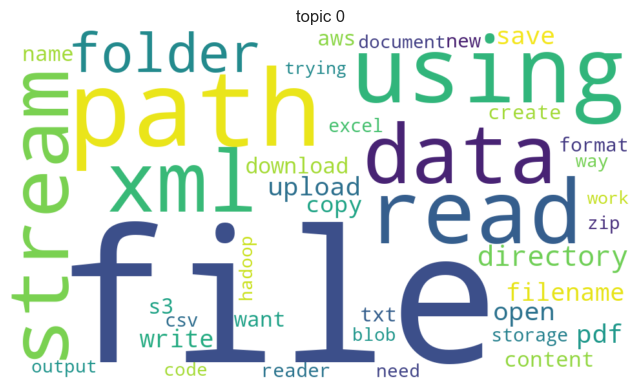

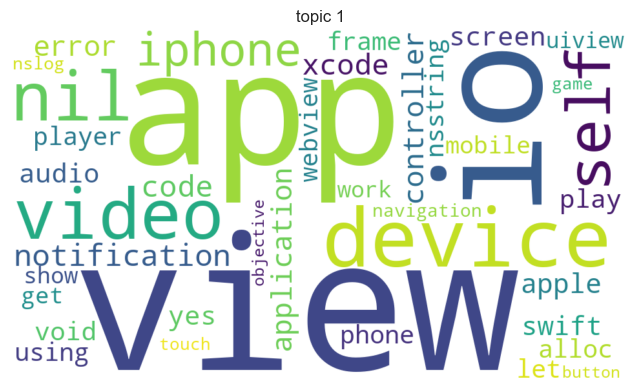

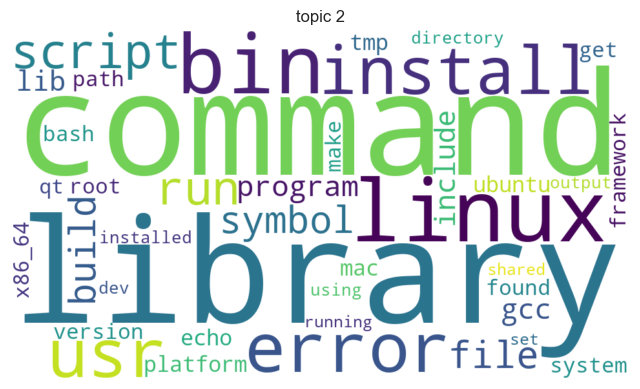

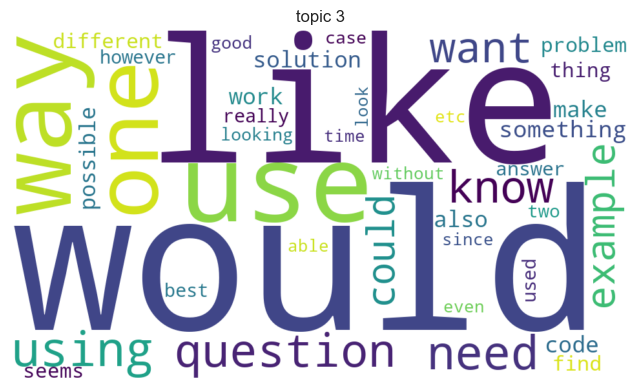

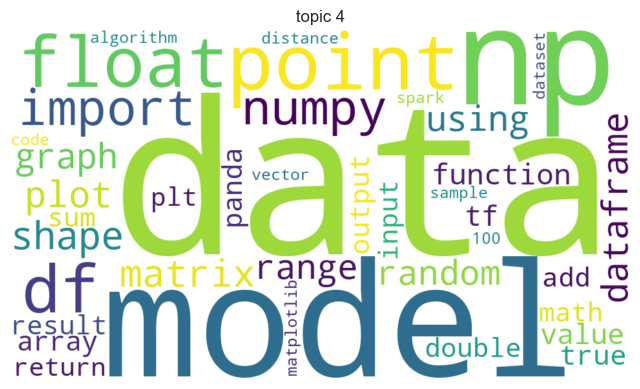

...

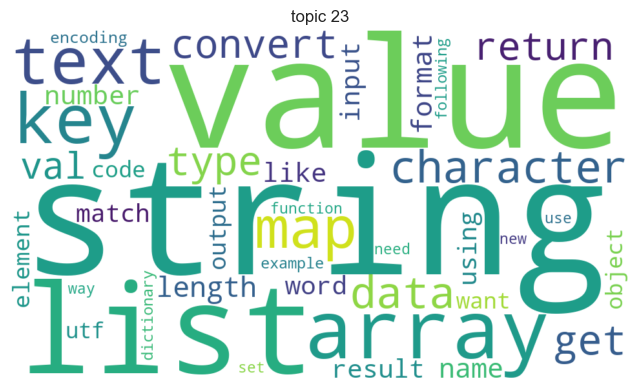

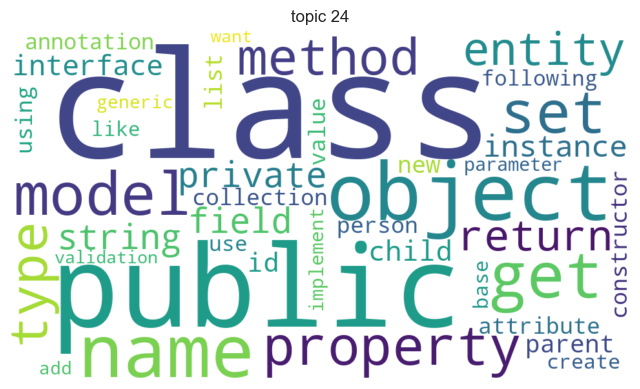

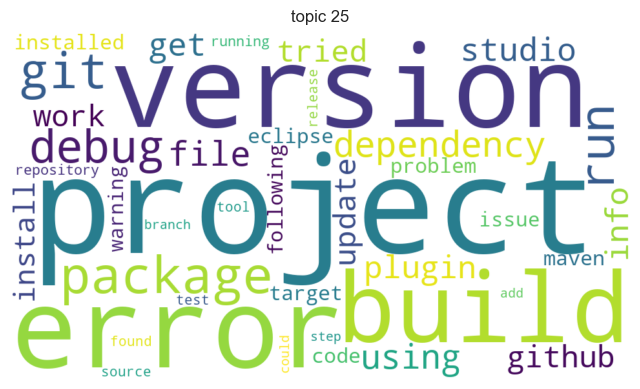

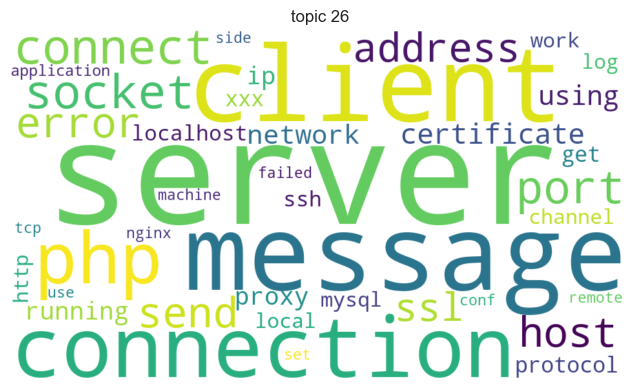

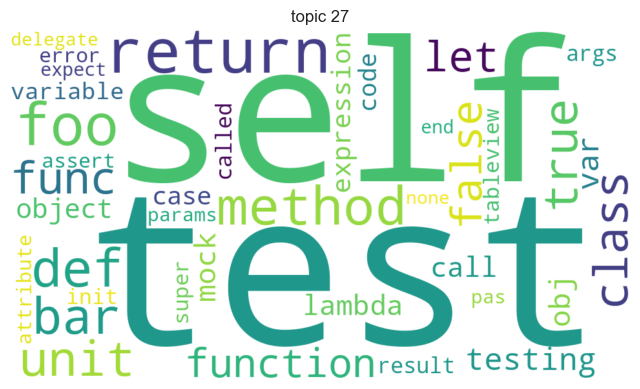

In [70]:
wordcloud_topics_gensim(lda_opt_model)

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Nonnegative Matrix Factorization (NMF)</span>

In [71]:
import warnings
warnings.filterwarnings("ignore")
nmf_gensim_model = Nmf(vectors_gensim, num_topics=n, id2word=dict_gensim, kappa=0.1, eval_every=5, random_state=42)

In [72]:
display_topics_gensim(nmf_gensim_model)


Topic 00
  class (0.02)
  function (0.01)
  item (0.01)
  int (0.01)
  public (0.01)

Topic 01
  public (0.02)
  string (0.02)
  new (0.02)
  id (0.02)
  user (0.01)

Topic 02
  java (0.03)
  com (0.01)
  service (0.01)
  xml (0.01)
  android (0.01)

Topic 03
  spring (0.02)
  android (0.02)
  org (0.01)
  const (0.01)
  java (0.01)

Topic 04
  server (0.01)
  net (0.01)
  asp (0.01)
  application (0.01)
  php (0.01)

Topic 05
  file (0.01)
  version (0.01)
  project (0.01)
  function (0.01)
  view (0.01)

Topic 06
  table (0.02)
  data (0.01)
  database (0.01)
  column (0.01)
  sql (0.01)

Topic 07
  html (0.01)
  app (0.01)
  page (0.01)
  user (0.01)
  browser (0.01)

Topic 08
  self (0.03)
  method (0.01)
  array (0.01)
  def (0.01)
  string (0.01)

Topic 09
  test (0.02)
  value (0.02)
  file (0.01)
  request (0.01)
  image (0.01)


In [73]:
pd.set_option('max_colwidth', 1000)
nmf_topic = pd.DataFrame(nmf_gensim_model.print_topics(), columns=['Topics', 'Proba*Word'])
nmf_topic

,Topics,Proba*Word
0,0,"0.024*""class"" + 0.015*""function"" + 0.012*""item"" + 0.011*""int"" + 0.011*""public"" + 0.009*""list"" + 0.009*""property"" + 0.009*""return"" + 0.008*""value"" + 0.008*""element"""
1,1,"0.022*""public"" + 0.019*""string"" + 0.018*""new"" + 0.017*""id"" + 0.011*""user"" + 0.011*""list"" + 0.011*""data"" + 0.011*""json"" + 0.011*""system"" + 0.010*""null"""
2,2,"0.027*""java"" + 0.015*""com"" + 0.013*""service"" + 0.012*""xml"" + 0.011*""android"" + 0.011*""web"" + 0.009*""http"" + 0.009*""log"" + 0.008*""array"" + 0.008*""org"""
3,3,"0.016*""spring"" + 0.015*""android"" + 0.012*""org"" + 0.012*""const"" + 0.011*""java"" + 0.010*""std"" + 0.010*""thread"" + 0.009*""map"" + 0.008*""app"" + 0.008*""hibernate"""
4,4,"0.014*""server"" + 0.013*""net"" + 0.009*""asp"" + 0.008*""application"" + 0.008*""php"" + 0.007*""error"" + 0.007*""ruby"" + 0.007*""client"" + 0.007*""session"" + 0.007*""web"""
5,5,"0.015*""file"" + 0.010*""version"" + 0.008*""project"" + 0.008*""function"" + 0.008*""view"" + 0.007*""library"" + 0.007*""command"" + 0.007*""image"" + 0.007*""studio"" + 0.006*""dll"""
6,6,"0.018*""table"" + 0.012*""data"" + 0.010*""database"" + 0.009*""column"" + 0.009*""sql"" + 0.009*""row"" + 0.007*""select"" + 0.006*""key"" + 0.005*""cell"" + 0.005*""bit"""
7,7,"0.012*""html"" + 0.011*""app"" + 0.008*""page"" + 0.008*""user"" + 0.007*""browser"" + 0.007*""input"" + 0.007*""js"" + 0.006*""chrome"" + 0.006*""window"" + 0.005*""device"""
8,8,"0.030*""self"" + 0.010*""method"" + 0.009*""array"" + 0.009*""def"" + 0.009*""string"" + 0.009*""server"" + 0.008*""call"" + 0.007*""application"" + 0.007*""message"" + 0.007*""object"""
9,9,"0.016*""test"" + 0.015*""value"" + 0.012*""file"" + 0.012*""request"" + 0.009*""image"" + 0.009*""date"" + 0.008*""python"" + 0.007*""api"" + 0.007*""text"" + 0.006*""end"""


In [74]:
nmf_gensim_coherence = CoherenceModel(model=nmf_gensim_model, texts=gensim_text, dictionary=dict_gensim, coherence='c_v')
nmf_gensim_coherence_score = nmf_gensim_coherence.get_coherence()
print(nmf_gensim_coherence_score)

0.4502141717717366


<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Hierarchical Dirichlet Process (HDP)</span>

In [75]:
from gensim.models import HdpModel
hdp_gensim_model = HdpModel(corpus=bow_gensim, id2word=dict_gensim)

In [76]:
import re
words = 8
pd.DataFrame([re.split(r" \+ |\*", t[1]) for t in hdp_gensim_model.print_topics(num_topics=20, num_words=words)])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.008,using,0.008,new,0.008,file,0.007,get,0.007,error,0.007,code,0.006,data,0.006,http
1,0.007,using,0.007,code,0.007,self,0.006,data,0.006,function,0.006,value,0.006,return,0.006,would
2,0.014,file,0.010,error,0.010,lib,0.007,using,0.006,10,0.006,app,0.006,py,0.006,usr
3,0.019,public,0.015,class,0.012,new,0.011,string,0.010,id,0.009,return,0.009,get,0.009,name
4,0.009,using,0.009,file,0.008,would,0.007,like,0.007,use,0.007,code,0.005,way,0.005,work
5,0.058,java,0.035,org,0.015,com,0.013,android,0.012,springframework,0.010,apache,0.007,web,0.007,sun
6,0.012,std,0.011,int,0.008,using,0.008,code,0.007,function,0.007,error,0.007,return,0.006,include
7,0.009,using,0.008,file,0.007,would,0.007,like,0.006,use,0.006,code,0.005,get,0.005,way
8,0.019,public,0.019,new,0.014,view,0.012,android,0.011,void,0.011,int,0.011,import,0.009,override
9,0.007,using,0.006,file,0.006,like,0.005,use,0.005,would,0.005,code,0.005,data,0.004,way


In [77]:
pd.set_option('max_colwidth', 1000)
pd.DataFrame(hdp_gensim_model.print_topics(num_topics=n, num_words=10), columns=["topic", "words"]).set_index("topic")

,words
topic,
0,0.008*using + 0.008*new + 0.008*file + 0.007*get + 0.007*error + 0.007*code + 0.006*data + 0.006*http + 0.006*function + 0.006*return
1,0.007*using + 0.007*code + 0.007*self + 0.006*data + 0.006*function + 0.006*value + 0.006*return + 0.006*would + 0.006*like + 0.005*new
2,0.014*file + 0.010*error + 0.010*lib + 0.007*using + 0.006*10 + 0.006*app + 0.006*py + 0.006*usr + 0.006*line + 0.005*python
3,0.019*public + 0.015*class + 0.012*new + 0.011*string + 0.010*id + 0.009*return + 0.009*get + 0.009*name + 0.008*using + 0.007*user
4,0.009*using + 0.009*file + 0.008*would + 0.007*like + 0.007*use + 0.007*code + 0.005*way + 0.005*work + 0.005*get + 0.005*one
5,0.058*java + 0.035*org + 0.015*com + 0.013*android + 0.012*springframework + 0.010*apache + 0.007*web + 0.007*sun + 0.006*jar + 0.006*class
6,0.012*std + 0.011*int + 0.008*using + 0.008*code + 0.007*function + 0.007*error + 0.007*return + 0.006*include + 0.006*file + 0.006*use
7,0.009*using + 0.008*file + 0.007*would + 0.007*like + 0.006*use + 0.006*code + 0.005*get + 0.005*way + 0.005*want + 0.005*work
8,0.019*public + 0.019*new + 0.014*view + 0.012*android + 0.011*void + 0.011*int + 0.011*import + 0.009*override + 0.008*return + 0.008*private


In [78]:
pd.set_option('max_colwidth', 1000)
pd.DataFrame(hdp_gensim_model.print_topics(num_topics=n, num_words=10), columns=["topic", "words"]).set_index("topic")

,words
topic,
0,0.008*using + 0.008*new + 0.008*file + 0.007*get + 0.007*error + 0.007*code + 0.006*data + 0.006*http + 0.006*function + 0.006*return
1,0.007*using + 0.007*code + 0.007*self + 0.006*data + 0.006*function + 0.006*value + 0.006*return + 0.006*would + 0.006*like + 0.005*new
2,0.014*file + 0.010*error + 0.010*lib + 0.007*using + 0.006*10 + 0.006*app + 0.006*py + 0.006*usr + 0.006*line + 0.005*python
3,0.019*public + 0.015*class + 0.012*new + 0.011*string + 0.010*id + 0.009*return + 0.009*get + 0.009*name + 0.008*using + 0.007*user
4,0.009*using + 0.009*file + 0.008*would + 0.007*like + 0.007*use + 0.007*code + 0.005*way + 0.005*work + 0.005*get + 0.005*one
5,0.058*java + 0.035*org + 0.015*com + 0.013*android + 0.012*springframework + 0.010*apache + 0.007*web + 0.007*sun + 0.006*jar + 0.006*class
6,0.012*std + 0.011*int + 0.008*using + 0.008*code + 0.007*function + 0.007*error + 0.007*return + 0.006*include + 0.006*file + 0.006*use
7,0.009*using + 0.008*file + 0.007*would + 0.007*like + 0.006*use + 0.006*code + 0.005*get + 0.005*way + 0.005*want + 0.005*work
8,0.019*public + 0.019*new + 0.014*view + 0.012*android + 0.011*void + 0.011*int + 0.011*import + 0.009*override + 0.008*return + 0.008*private


In [79]:
hdp_gensim_model.show_topic(0, topn=10)

[('using', 0.008469419600122308),
 ('new', 0.00781850524471563),
 ('file', 0.007773542755183863),
 ('get', 0.007035376282906399),
 ('error', 0.006766505353650453),
 ('code', 0.006738056311889834),
 ('data', 0.006475470748934425),
 ('http', 0.006053611624496732),
 ('function', 0.006015076034864124),
 ('return', 0.005900971626558376)]

In [80]:
def display_topics_gensim_hdp(model, num_topics):
    for topic in range(0, num_topics):
        print("\nTopic %02d" % topic)
        for (word, prob) in model.show_topic(topic, topn=10):
            print("  %s (%2.2f)" % (word, prob))

In [81]:
display_topics_gensim_hdp(hdp_gensim_model, 10)


Topic 00
  using (0.01)
  new (0.01)
  file (0.01)
  get (0.01)
  error (0.01)
  code (0.01)
  data (0.01)
  http (0.01)
  function (0.01)
  return (0.01)

Topic 01
  using (0.01)
  code (0.01)
  self (0.01)
  data (0.01)
  function (0.01)
  value (0.01)
  return (0.01)
  would (0.01)
  like (0.01)
  new (0.01)

Topic 02
  file (0.01)
  error (0.01)
  lib (0.01)
  using (0.01)
  10 (0.01)
  app (0.01)
  py (0.01)
  usr (0.01)
  line (0.01)
  python (0.01)

Topic 03
  public (0.02)
  class (0.01)
  new (0.01)
  string (0.01)
  id (0.01)
  return (0.01)
  get (0.01)
  name (0.01)
  using (0.01)
  user (0.01)

Topic 04
  using (0.01)
  file (0.01)
  would (0.01)
  like (0.01)
  use (0.01)
  code (0.01)
  way (0.01)
  work (0.01)
  get (0.01)
  one (0.00)

Topic 05
  java (0.06)
  org (0.03)
  com (0.01)
  android (0.01)
  springframework (0.01)
  apache (0.01)
  web (0.01)
  sun (0.01)
  jar (0.01)
  class (0.01)

Topic 06
  std (0.01)
  int (0.01)
  using (0.01)
  code (0.01)
  function

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> singular value decomposition (SVD)</span>

In [82]:
from sklearn.decomposition import TruncatedSVD

svd_model = TruncatedSVD(n_components = 10, random_state=42)
W_svd_matrix = svd_model.fit_transform(X_train_cvtb)
H_svda_matrix = svd_model.components_

In [83]:
display_topics(svd_model, vectorizertb.get_feature_names_out())


Topic 00
  java (7.47)
  org (4.55)
  springframework (1.72)
  com (1.22)
  apache (1.16)

Topic 01
  10 (16.20)
  00 (1.15)
  file (0.75)
  new (0.59)
  lib (0.56)

Topic 02
  00 (1.45)
  file (1.08)
  new (0.98)
  public (0.85)
  return (0.77)

Topic 03
  00 (14.71)
  07 (6.05)
  08 (5.28)
  2016 (4.78)
  05 (2.45)

Topic 04
  java (32.15)
  android (17.81)
  com (10.73)
  00 (6.94)
  view (6.37)

Topic 05
  mono (158.74)
  lib (91.88)
  usr (65.86)
  file (47.67)
  local (42.00)

Topic 06
  mono (17.25)
  public (8.30)
  new (6.79)
  string (5.10)
  class (3.56)

Topic 07
  scala (17.05)
  org (6.82)
  internal (6.01)
  reflect (5.73)
  apache (5.12)

Topic 08
  scala (8.04)
  self (6.67)
  file (5.74)
  00 (4.48)
  py (4.43)

Topic 09
  scala (48.10)
  js (26.82)
  lib (21.28)
  android (19.24)
  app (18.58)


In [84]:
svd_model.singular_values_

array([1524.58001381, 1045.38539137,  880.79511935,  797.73993206,
        684.54525589,  656.41582014,  571.40986862,  514.9095363 ,
        502.18647213,  489.60829831])

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Clustering</span>

In [85]:
from sklearn.cluster import KMeans
k_means = KMeans(n_clusters=5, random_state=42)
k_means.fit(X_train_cvtb)

KMeans(n_clusters=5, random_state=42)

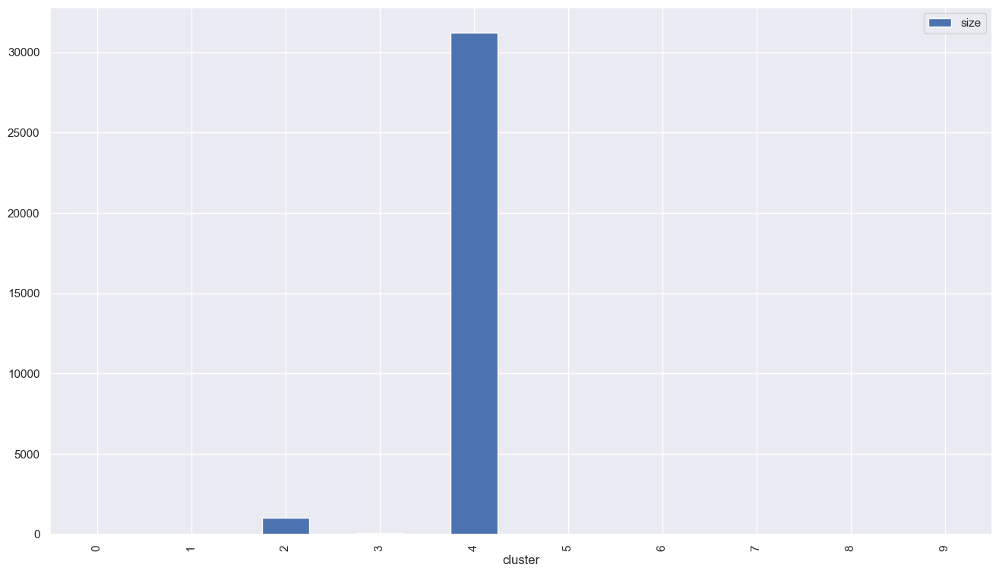

In [86]:
sizes = []
for i in range(10):
    sizes.append({"cluster": i, "size": np.sum(k_means.labels_==i)})
pd.DataFrame(sizes).set_index("cluster").plot.bar(figsize=(16,9))
plt.savefig("cluster-size.svg")

In [87]:
np.unique(k_means.labels_, return_counts=True)

(array([0, 1, 2, 3, 4]),
 array([    1,     6,  1026,   102, 31225], dtype=int64))

In [88]:
def wordcloud_clusters(model, vectors, features, no_top_words=40):
    import warnings
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    for cluster in np.unique(model.labels_):
        size = {}
        words = vectors[model.labels_ == cluster].sum(axis=0).A[0]
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", max_words=100, width=960, height=540)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'cluster{cluster}.png')

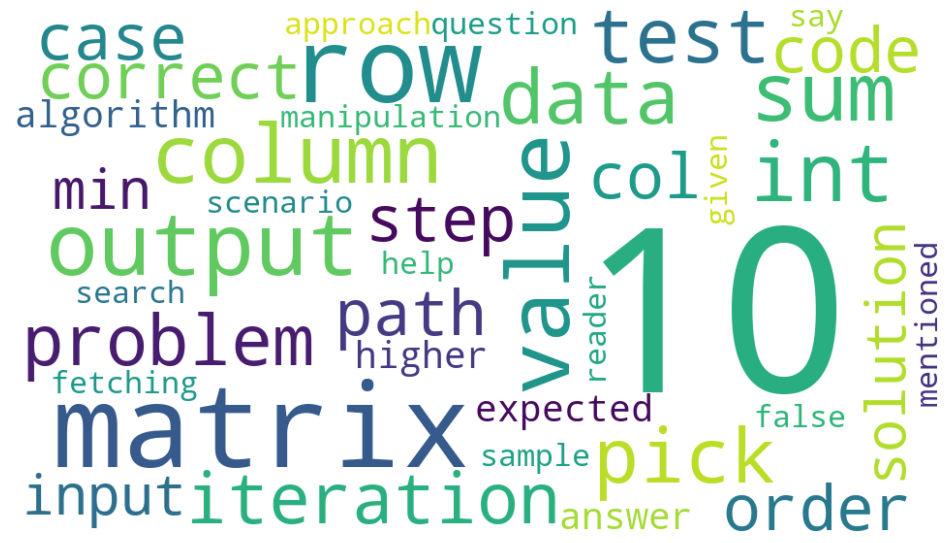

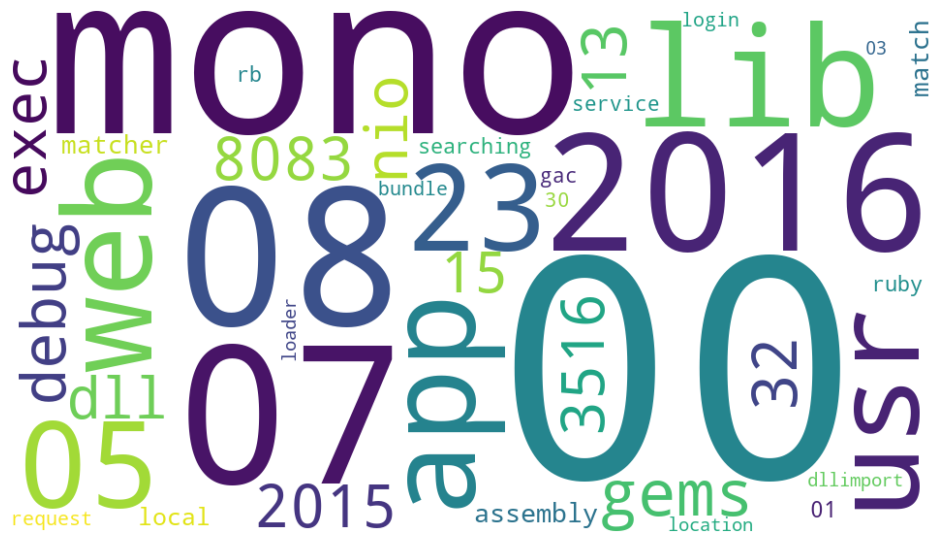

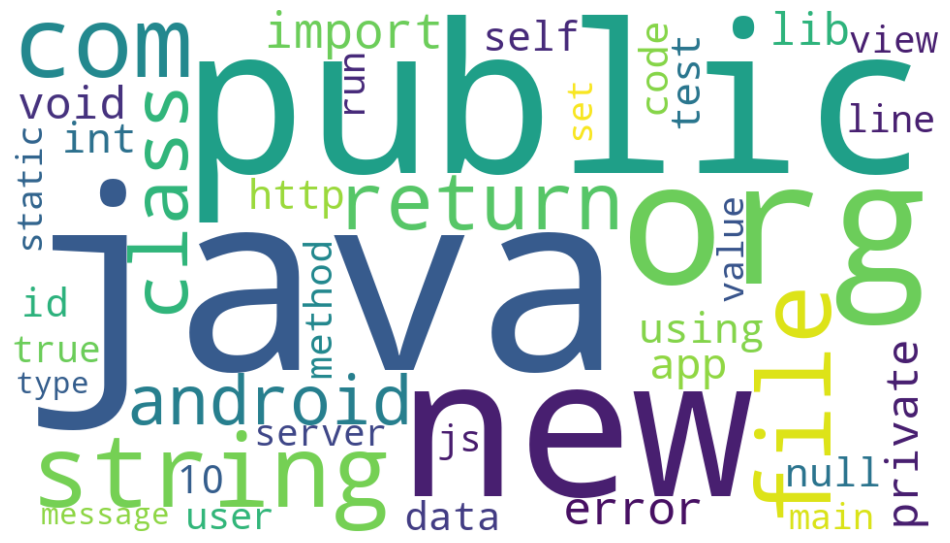

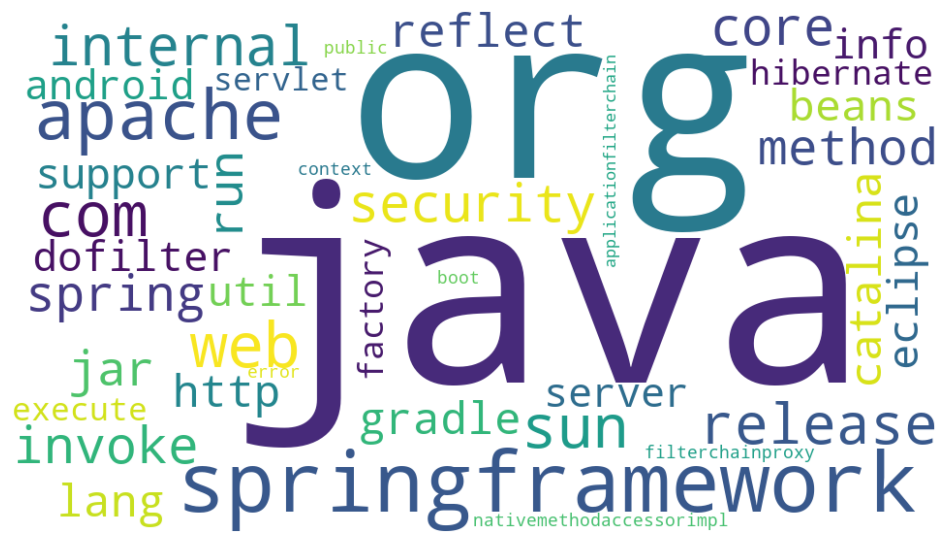

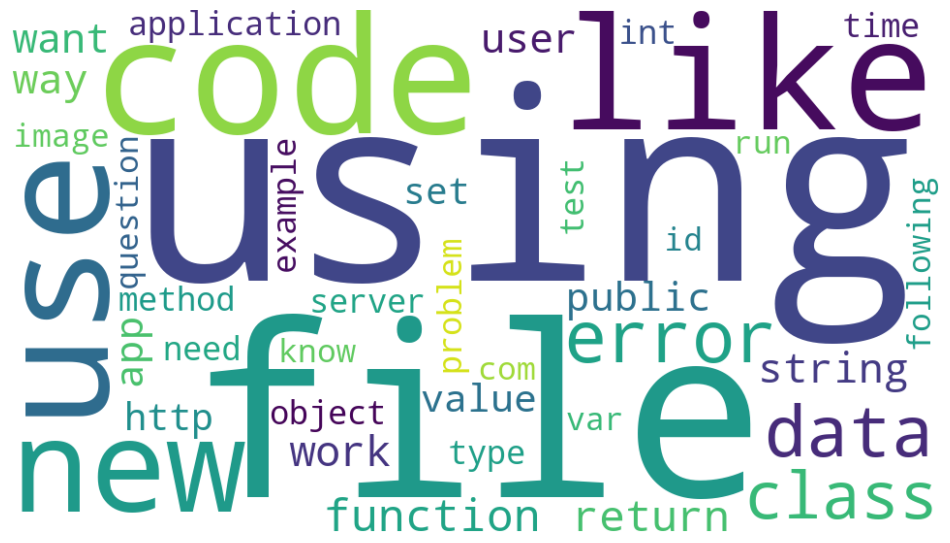

In [89]:
wordcloud_clusters(k_means, X_train_cvtb, vectorizertb.get_feature_names_out())

<a id="IR"></a>
<h1 style="background-color:#ffb770 ;padding:20px;border-radius:10px;border:10px solid #a3a3a3;font-weight: 1000;color:#000000;text-align:center; font-size: 2.0em" >Tags Modelling: Supervised Approach with LDA</h1>

In [90]:
# Classifiers
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Perceptron, SGDOneClassSVM
from sklearn.naive_bayes import MultinomialNB
from sklearn.multiclass import OneVsRestClassifier
from sklearn.multioutput import MultiOutputClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier

# Metrics
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, accuracy_score, jaccard_score, make_scorer, hamming_loss
from sklearn.model_selection import cross_val_score

# Fine tuning

from sklearn.metrics import f1_score
from hyperopt import fmin, tpe, hp, Trials
import optuna

In [91]:
import sklearn.metrics as metrics
from sklearn.metrics import precision_recall_fscore_support as score
from typing import Dict, Any, Tuple


def modelling(models: Dict[str, Any], X_train: pd.DataFrame, X_test: pd.DataFrame,
              y_train: pd.DataFrame, y_test: pd.DataFrame) -> Dict[str, Dict[str, float]]:
    """
    Perform classification using multiple models and evaluate their performance.

    Args:
        models (Dict[str, Any]): A dictionary containing the names of the classifiers as keys and the corresponding
                                 classifier objects as values.
        X_train (pd.DataFrame): The training data features.
        X_test (pd.DataFrame): The testing data features.
        y_train (pd.DataFrame): The training data labels.
        y_test (pd.DataFrame): The testing data labels.

    Returns:
        Dict[str, Dict[str, float]]: A dictionary containing the evaluation scores for each classifier.

    """
    scores = {}
    for clf_name, classifier in models.items():
        print("*" * 89)
        print(f"{' ' * 38}{clf_name}")
        print("*" * 89)

        clf = OneVsRestClassifier(classifier)
        clf.fit(X_train, y_train)
        y_pred_train = clf.predict(X_train)
        y_pred = clf.predict(X_test)

        precision_train = precision_score(y_train, y_pred_train, average="micro")
        precision = precision_score(y_test, y_pred, average="micro")
        recall_train = recall_score(y_train, y_pred_train, average="micro")
        recall = recall_score(y_test, y_pred, average="micro")
        fscore_train = f1_score(y_train, y_pred_train, average="micro")
        fscore = f1_score(y_test, y_pred, average="micro")
        jaccard_train = jaccard_score(y_train, y_pred_train, average='samples')
        jaccard = jaccard_score(y_test, y_pred, average='samples')
        accuracy_train = accuracy_score(y_train, y_pred_train)
        accuracy = accuracy_score(y_test, y_pred)
        hamLoss_train = hamming_loss(y_train, y_pred_train)
        hamLoss = hamming_loss(y_test, y_pred)

        print(f"precision on train: {precision_train}, and test: {precision}")
        print(f"recall score on train: {recall_train}, and test: {recall}")
        print(f"fscore score on train: {fscore_train}, and test: {fscore}")
        print(f"Jaccard score on train: {jaccard_train}, and test: {jaccard}")
        print(f"Accuracy score on train: {accuracy_train}, and test: {accuracy}")
        print(f"Hamming Loss score on train: {hamLoss_train}, and test: {hamLoss}")

        scores[clf_name] = {
            "Precision": precision,
            "Recall": recall,
            "Fscore": fscore,
            "Jaccard": jaccard,
            "Accuracy": accuracy,
            "Hamming Loss": hamLoss
        }
    return scores

In [92]:
models = {                   
                   'Logistic Regression' : LogisticRegression( random_state=42),
                   'Linear SVC': LinearSVC(),
                    #"Ridge Classifier" :  RidgeClassifier(random_state=42),
                   # "lgbm Classifier": LGBMClassifier(random_state=42),
                   'SGDClassifier': SGDClassifier(random_state=42),
                    "Passive Aggressive Classifier" : PassiveAggressiveClassifier(random_state=42),
                    "Perceptron" : Perceptron(random_state=42),
                    "Solves linear One-Class SVM" : SGDOneClassSVM(random_state=42),
                    "MultinomialNB" : MultinomialNB()
                  }

## Prediction with LDA

In [93]:
from sklearn.multioutput import MultiOutputClassifier

In [94]:
topic_dist = [lda_opt_model.get_document_topics(doc) for doc in tfidf_corpus]
W_lda_matrix = gensim.matutils.corpus2dense(topic_dist, num_terms=lda_opt_model.num_topics).T

In [95]:
from gensim.utils import simple_preprocess

tokenized_test_texts = [simple_preprocess(text, deacc=True) for text in X_test["titleandbody"]]

# Create bag of words representation
test_texts_bow = [dict_gensim.doc2bow(tokens) for tokens in tokenized_test_texts]

# Apply LDA model to bag of words representation
X_test_lda  = [lda_opt_model[test_bow] for test_bow in test_texts_bow]

# Convert LDA vectors to matrix
W_lda_test = gensim.matutils.corpus2dense(X_test_lda, num_terms=lda_opt_model.num_topics).T

In [96]:
Scoring_lda = modelling(models, W_lda_matrix,W_lda_test, y_train_mlb, y_test_mlb)

*****************************************************************************************
                                      Logistic Regression
*****************************************************************************************
precision on train: 0.6083183123038921, and test: 0.5946760421898544
recall score on train: 0.11591400585167282, and test: 0.122783366172353
fscore score on train: 0.19472373890093925, and test: 0.20354134433556814
Jaccard score on train: 0.11414466936716627, and test: 0.11560134520797045
Accuracy score on train: 0.030593325092707045, and test: 0.027166070644331512
Hamming Loss score on train: 0.011644777503090235, and test: 0.011626827279001191
*****************************************************************************************
                                      Linear SVC
*****************************************************************************************
precision on train: 0.6617326948193296, and test: 0.6741031590219525
recall score o

In [97]:
score_lda = pd.DataFrame(Scoring_lda)
score_lda

,Logistic Regression,Linear SVC,SGDClassifier,Passive Aggressive Classifier,Perceptron,Solves linear One-Class SVM,MultinomialNB
Precision,0.594676,0.674103,0.737943,0.423050,0.163003,0.0000,0.750000
Recall,0.122783,0.097921,0.068625,0.171394,0.192445,0.0000,0.000078
Fscore,0.203541,0.171002,0.125572,0.243953,0.176505,0.0000,0.000156
Jaccard,0.115601,0.101414,0.077257,0.150640,0.104431,0.0000,0.000073
Accuracy,0.027166,0.025723,0.022586,0.031683,0.010477,0.0000,0.000000
Hamming Loss,0.011627,0.011488,0.011564,0.012854,0.021728,0.0121,0.012099


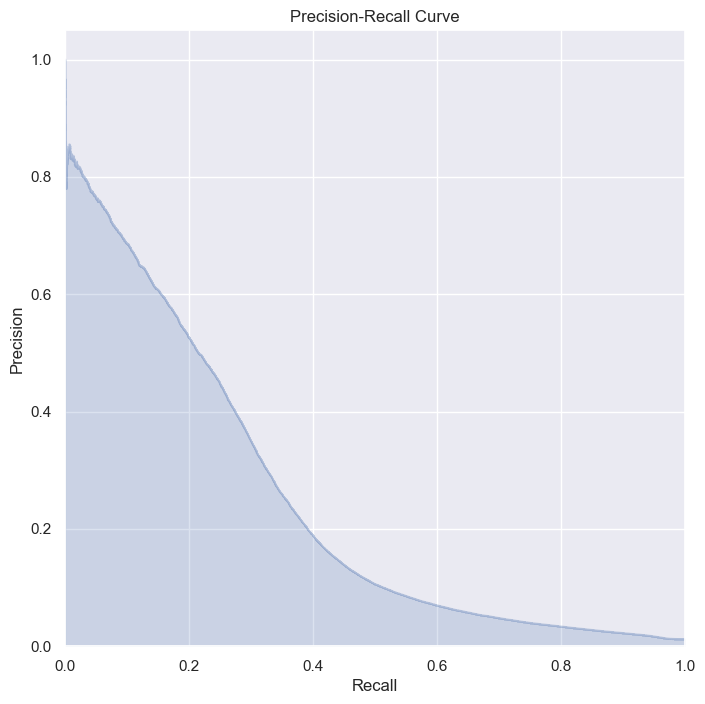

In [98]:
from sklearn.metrics import precision_recall_curve
clf = OneVsRestClassifier(SGDClassifier(random_state=42))
clf.fit(W_lda_matrix, y_train_mlb)
# Get predicted probabilities for each label
y_scores = clf.decision_function(W_lda_test)

# Compute precision-recall curve for each label
precision, recall, _ = precision_recall_curve(y_test_mlb.ravel(), y_scores.ravel())

# Plot precision-recall curve for each label
plt.figure(figsize=(8, 8))
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.show()


Text(0.5, 1.0, 'Micro-average Receiver Operating Characteristic')

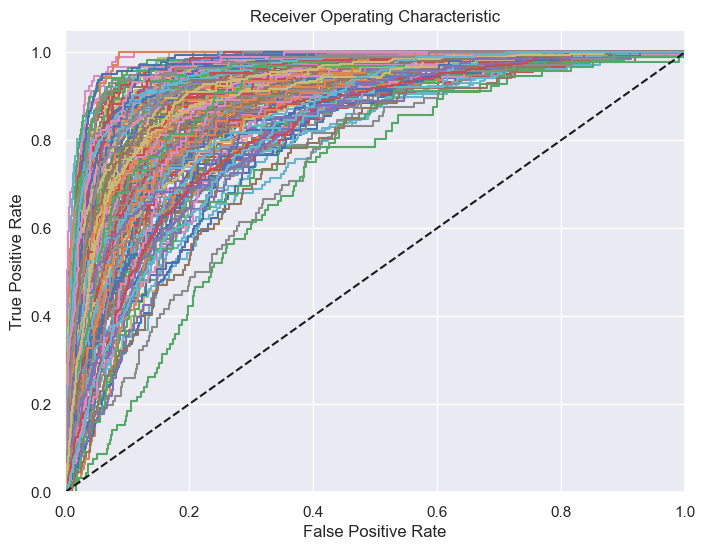

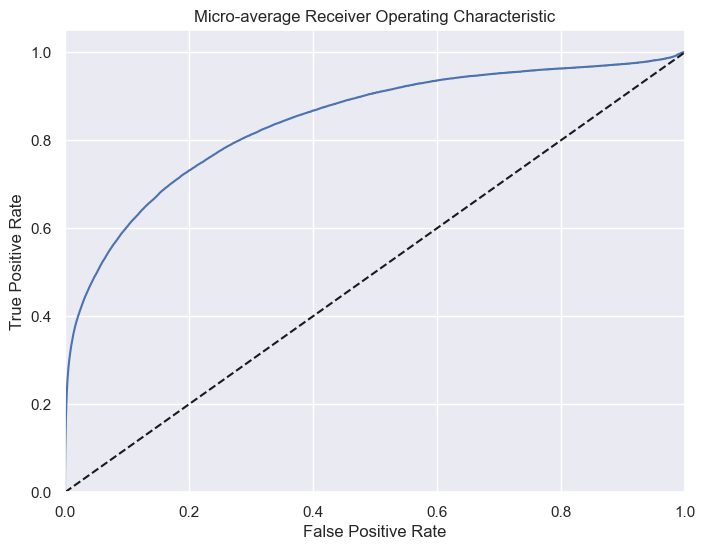

In [99]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier

# Binarize the labels
y_test_bin = label_binarize(y_test_mlb, classes=list(range(len(tags))))

# Get predicted probabilities for each label
y_scores = clf.decision_function(W_lda_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(tags)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin.ravel(), y_scores.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Plot ROC curve for each class
plt.figure(figsize=(8,6))
for i in range(len(tags)):
    plt.plot(fpr[i], tpr[i], label=f'{tags[i]} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
#plt.legend(loc='lower right')

# Plot micro-average ROC curve
plt.figure(figsize=(8,6))
plt.plot(fpr_micro, tpr_micro, label=f'Micro-average (AUC = {roc_auc_micro:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average Receiver Operating Characteristic')
#plt.legend(loc='lower right')


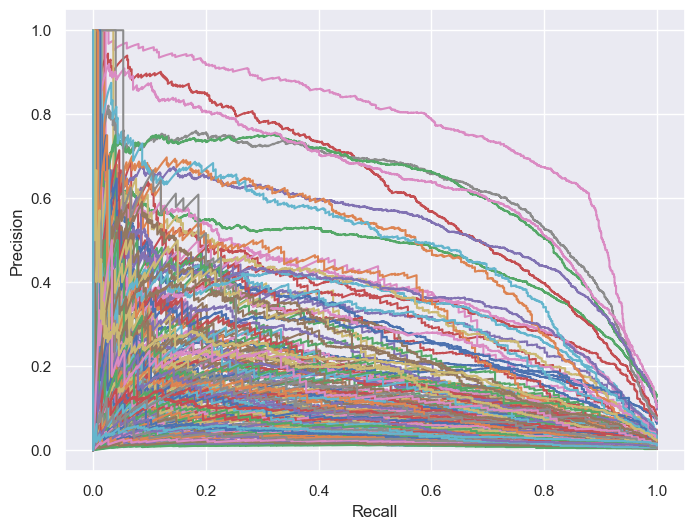

In [100]:
from sklearn.metrics import precision_recall_curve

# Get predicted probabilities for each label
y_scores = clf.decision_function(W_lda_test)

# Compute precision-recall curve for each label
precision = dict()
recall = dict()
for i in range(len(tags)):
    precision[i], recall[i], _ = precision_recall_curve(y_test_mlb[:, i], y_scores[:, i])

# Plot precision-recall curves for each label
fig, ax = plt.subplots(figsize=(8, 6))
for i in range(len(tags)):
    ax.plot(recall[i], precision[i], label=tags[i])

# Set axis labels and legend
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
#ax.legend()
ax.grid(True)
plt.show()


In [101]:
from sklearn.linear_model import LogisticRegression
# Train a logistic regression model on the LDA-transformed data
y_train_trans = np.argmax(y_train_mlb, axis=1)
clf = LogisticRegression()
clf.fit(W_lda_matrix, y_train_trans)

LogisticRegression()

In [102]:
from sklearn.metrics import classification_report, confusion_matrix
# Make predictions on LDA-transformed test data
y_pred_lda = clf.predict(W_lda_test)

# Convert test labels to indices
y_test_trans = np.argmax(y_test_mlb, axis=1)

# Compute classification report
print(classification_report(y_test_trans, y_pred_lda))

# Compute confusion matrix
print(confusion_matrix(y_test_trans, y_pred_lda))

              precision    recall  f1-score   support

           0       0.20      0.60      0.30       999
           1       0.00      0.00      0.00        46
           2       0.19      0.30      0.23       177
           3       0.21      0.40      0.28       254
           4       0.11      0.14      0.12        64
           5       0.11      0.04      0.06        90
           6       0.70      0.75      0.72      1103
           8       0.00      0.00      0.00        10
           9       0.11      0.01      0.01       141
          10       0.23      0.08      0.12       142
          11       0.19      0.20      0.20        98
          12       0.00      0.00      0.00        68
          13       0.14      0.01      0.02        86
          14       0.15      0.20      0.17       189
          15       0.26      0.15      0.19       312
          16       0.00      0.00      0.00        47
          17       0.00      0.00      0.00       143
          18       0.00    

In [103]:
print("The accuracy is :", accuracy_score(y_test_trans, y_pred_lda))
print("The precision is :",  precision_score(y_test_trans, y_pred_lda, average = "micro"))
print("The fscore is :",  f1_score(y_test_trans, y_pred_lda, average = "micro"))
print("The jaccard_score is:", jaccard_score(y_test_trans, y_pred_lda, average = "weighted"))

The accuracy is : 0.3034067381893469
The precision is : 0.3034067381893469
The fscore is : 0.3034067381893469
The jaccard_score is: 0.15419910583623167


In [104]:
from sklearn.multioutput import MultiOutputClassifier
from sklearn.linear_model import LogisticRegression
# Train a logistic regression model on the LDA-transformed data
y_train_trans = np.argmax(y_train_mlb, axis=1)
clf = OneVsRestClassifier(LogisticRegression(max_iter=1000))
clf.fit(W_lda_matrix, y_train_mlb)

OneVsRestClassifier(estimator=LogisticRegression(max_iter=1000))

In [105]:
y_pred_lda = clf.predict(W_lda_test)
print(accuracy_score(y_test_mlb, y_pred_lda))
print("The accuracy is :", accuracy_score(y_test_mlb, y_pred_lda))
print("The precision is :",  precision_score(y_test_mlb, y_pred_lda, average = "micro"))
print("The fscore is :",  f1_score(y_test_mlb, y_pred_lda, average = "micro"))
print("The jaccard_score is:", jaccard_score(y_test_mlb, y_pred_lda, average = "weighted"))

0.027166070644331512
The accuracy is : 0.027166070644331512
The precision is : 0.5946760421898544
The fscore is : 0.20354134433556814
The jaccard_score is: 0.10683901765838716


In [106]:
lda_scoring=modelling(models, W_lda_matrix,W_lda_test, y_train_mlb, y_test_mlb)

*****************************************************************************************
                                      Logistic Regression
*****************************************************************************************
precision on train: 0.6083183123038921, and test: 0.5946760421898544
recall score on train: 0.11591400585167282, and test: 0.122783366172353
fscore score on train: 0.19472373890093925, and test: 0.20354134433556814
Jaccard score on train: 0.11414466936716627, and test: 0.11560134520797045
Accuracy score on train: 0.030593325092707045, and test: 0.027166070644331512
Hamming Loss score on train: 0.011644777503090235, and test: 0.011626827279001191
*****************************************************************************************
                                      Linear SVC
*****************************************************************************************
precision on train: 0.6617032392894462, and test: 0.6741031590219525
recall score o

In [ ]:
# Define the hyperparameter search space
space = {
    'C': hp.loguniform('C', 0.01, 10),
    'penalty': hp.choice('penalty', ['l2', 'none']),
    'solver': hp.choice('solver', ['newton-cg', 'lbfgs', 'sag', 'saga']),
    'tol': hp.loguniform('tol', -10, 0),
}

# Define the objective function
def objective(params):
    clf = OneVsRestClassifier(LogisticRegression(**params))
    score = np.mean(cross_val_score(clf, W_lda_matrix, y_train_mlb, cv=5, scoring='jaccard'))
    return {'loss': - score, 'status': 'ok'}

# Use the Tree-structured Parzen Estimator (TPE) algorithm for optimization
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100,  rstate=np.random.default_rng())

# Print the best hyperparameters
print(best)

  5%|██▎                                            | 5/100 [07:10<2:24:03, 90.99s/trial, best loss=?]

In [ ]:
# Define the objective function for optimization
def objective(trial):
    # Set up the classifier
    clf = OneVsRestClassifier(LogisticRegression(
        penalty=trial.suggest_categorical('penalty', [ 'l2',  'none']),
        C=trial.suggest_float('C', 0.01, 10.0),
        solver=trial.suggest_categorical('solver', ['newton-cg', 'lbfgs', 'sag', 'saga'])
    ))
    # Fit the classifier on the training data
    clf.fit(W_lda_matrix, y_train_mlb)
    # Compute the Jaccard score on the test data
    y_pred = clf.predict(W_lda_test)
    return jaccard_score(y_test_mlb, y_pred, average='samples')

# Create a study object
study = optuna.create_study(direction='maximize')

# Use the study object to conduct the optimization
study.optimize(objective, n_trials=50)

In [ ]:
# Get the best hyperparameters
best_params = study.best_params


In [ ]:
import seaborn as sns

# Get the predicted values of the model
y_pred = clf.predict(X_test_cv_lda)

# Get the true labels of the test data
y_true = np.argmax(y_test_mlb, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the heatmap
sns.heatmap(cm, annot=True, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


# Bibliographie

**Jens Albrecht, Sidharth Ramachandran, and Christian Winkler (2021)**, *Blueprints for Text Analytics Using Python*

**Chris McCormick and Nick Ryan. (2019, May 14).** *BERT Word Embeddings Tutorial.* Retrieved from http://www.mccormickml.com